In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from transformers import pipeline
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
import pymannkendall as mk
from math import sqrt
import pmdarima as pm
from pmdarima.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import json
import ast
import locale
locale.setlocale(locale.LC_ALL, "nl_NL")

'nl_NL'

In [2]:
with open('paper_selectors.txt', 'r') as file:
    papers = ast.literal_eval(file.read())

with open('party_selectors.txt', 'r') as file:
    parties = ast.literal_eval(file.read())

with open('party_synonyms.txt', 'r') as file:
    party_synonyms = ast.literal_eval(file.read())

with open('months.txt', 'r') as file:
    months = ast.literal_eval(file.read())

with open('min_mentions_per_article.txt', 'r') as file:
    min_val = int(file.read())

In [3]:
for synonym in party_synonyms:
    parties = [x for x in parties if x not in synonym[1:]]

In [4]:
with open("../../data/title_sentiment_per_party.json") as file:
    data = json.load(file)

party_sentiment = {key: pd.DataFrame(data[key]) for key in data}

In [5]:
party_sentiment

{'50Plus':             title_compound  title_neg  title_neu  title_pos
 2023-08-21             NaN        NaN        NaN        NaN
 2023-08-22         -0.0258      0.096      0.812      0.091
 2023-08-23          0.3612      0.000      0.667      0.333
 2023-08-24             NaN        NaN        NaN        NaN
 2023-08-25             NaN        NaN        NaN        NaN
 ...                    ...        ...        ...        ...
 2023-12-01             NaN        NaN        NaN        NaN
 2023-12-02             NaN        NaN        NaN        NaN
 2023-12-03             NaN        NaN        NaN        NaN
 2023-12-04             NaN        NaN        NaN        NaN
 2023-12-05             NaN        NaN        NaN        NaN
 
 [107 rows x 4 columns],
 'BBB':             title_compound  title_neg  title_neu  title_pos
 2023-08-21        0.087011   0.068556   0.781444   0.149889
 2023-08-22       -0.189580   0.128300   0.853500   0.018200
 2023-08-23        0.190900   0.000000   

In [6]:
descriptives = pd.DataFrame()
for party in parties:
    for sentiment in ['title_neu']:
        # print(f"{party} {sentiment}")
        # display(party_sentiment[party][sentiment].describe())
        descriptives[f"{party} {sentiment}"] = party_sentiment[party][sentiment]

display(descriptives.stack().reset_index())

,level_0,level_1,0
0,2023-08-21,VVD title_neu,0.775308
1,2023-08-21,CDA title_neu,0.741409
2,2023-08-21,D66 title_neu,0.767667
3,2023-08-21,SGP title_neu,0.927500
4,2023-08-21,GroenLinks-PvdA title_neu,0.832333
...,...,...,...
1388,2023-11-30,50Plus title_neu,1.000000
1389,2023-11-30,Denk title_neu,0.883600
1390,2023-11-30,FvD title_neu,0.810000
1391,2023-11-30,BBB title_neu,0.849000


Text(0.5, 0, 'GroenLinks-PvdA')

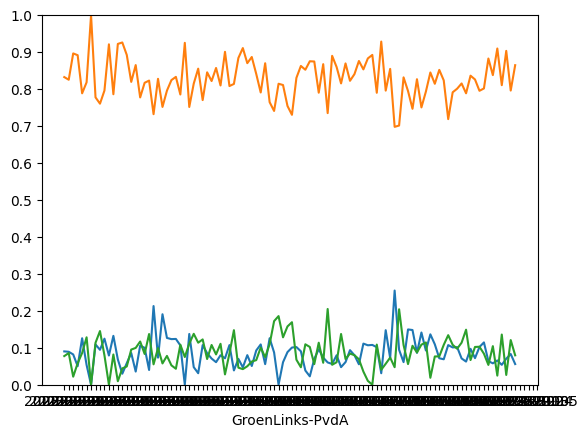

In [7]:
plt.ylim(0, 1.0)
plt.yticks(np.arange(0,1.1, step=0.1))
# plt.xticks(rotation=45)
plt.plot(party_sentiment['GroenLinks-PvdA']['title_pos'])
plt.plot(party_sentiment['GroenLinks-PvdA']['title_neu'])
plt.plot(party_sentiment['GroenLinks-PvdA']['title_neg'])
plt.xlabel('GroenLinks-PvdA')

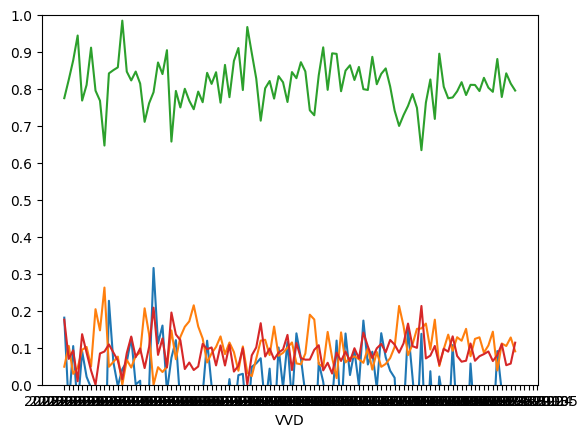

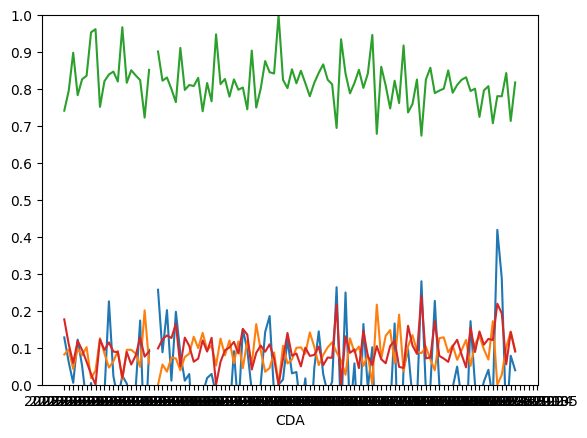

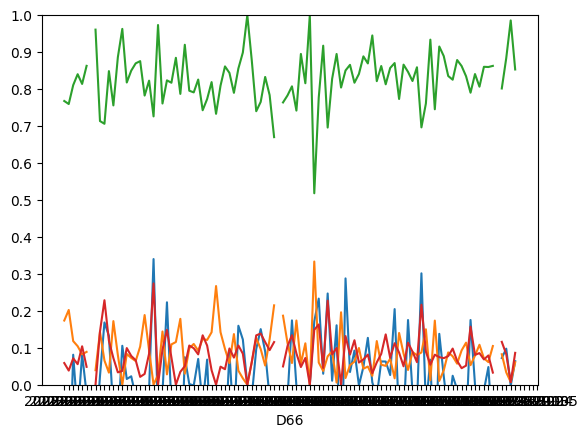

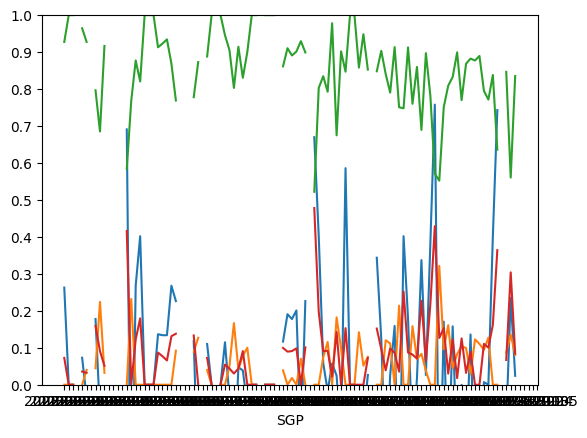

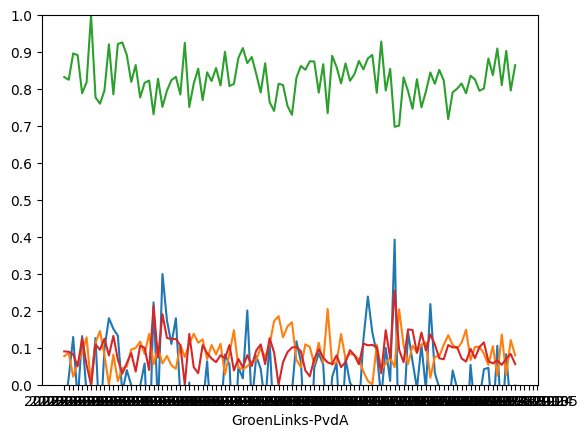

...

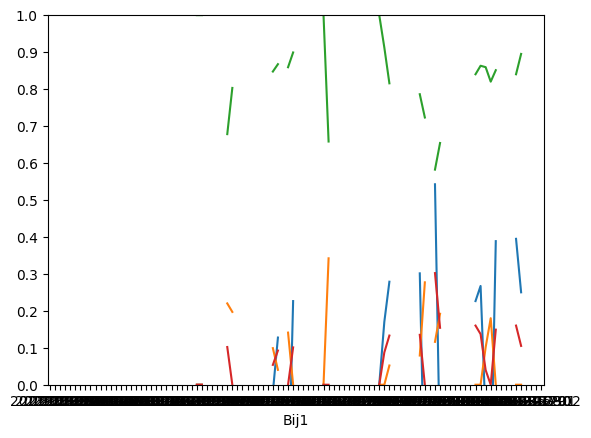

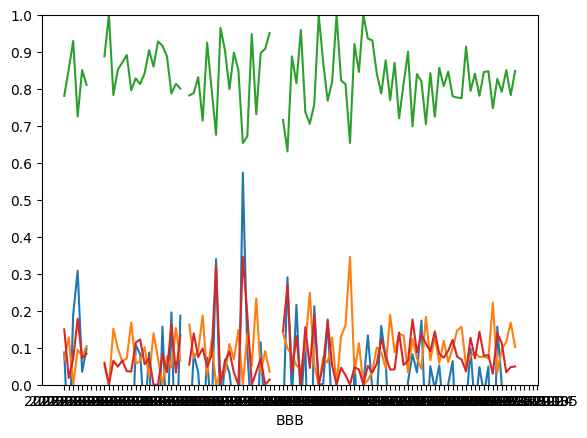

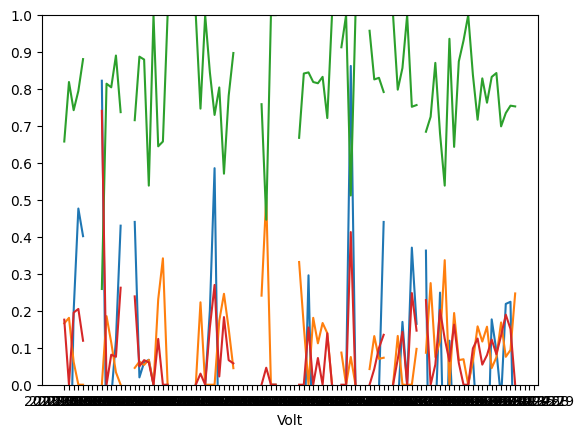

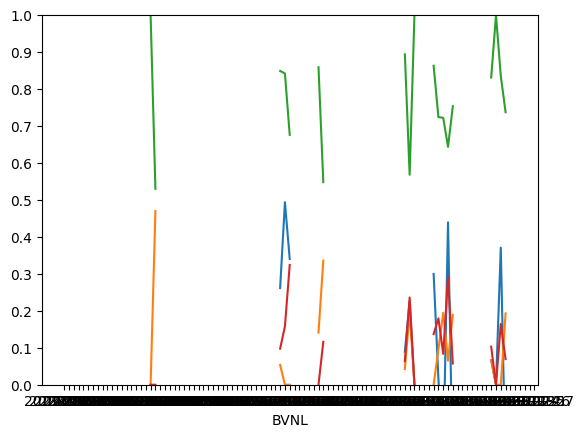

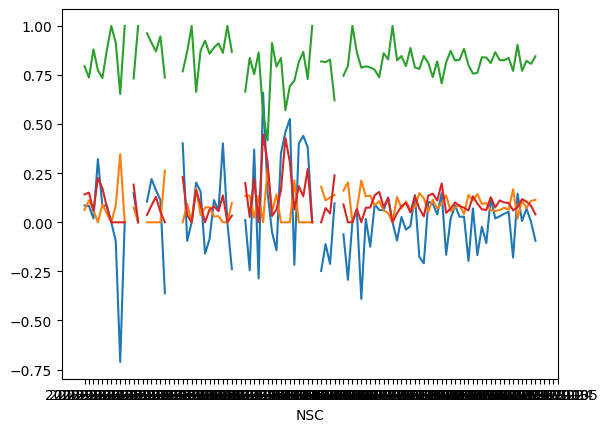

In [8]:
for idx, party_data in enumerate(parties):
    plt.ylim(0, 1.0)
    plt.yticks(np.arange(0,1.1, step=0.1))
    # plt.xticks(rotation=45)
    plt.figure(idx+1)
    plt.plot(party_sentiment[party_data])
    plt.xlabel(party_data)

plt.show()

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


50Plus has insufficient data for PACF
50Plus has insufficient data for PACF
50Plus has insufficient data for PACF
50Plus has insufficient data for PACF
BVNL has insufficient data for PACF
BVNL has insufficient data for PACF
BVNL has insufficient data for PACF
BVNL has insufficient data for PACF


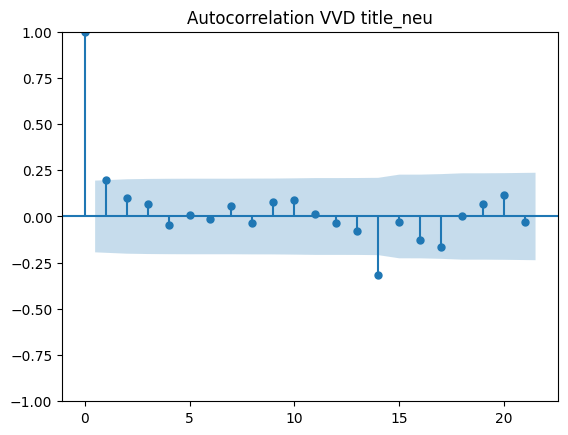

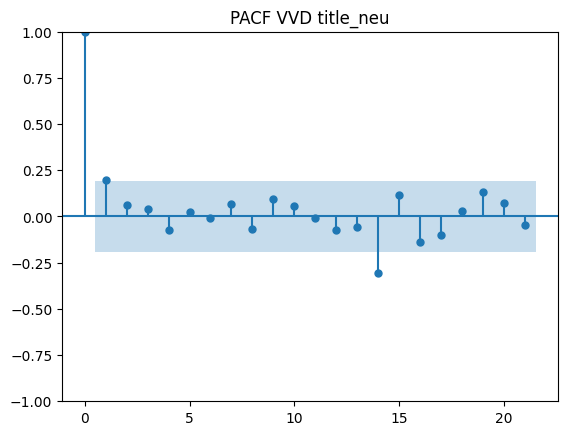

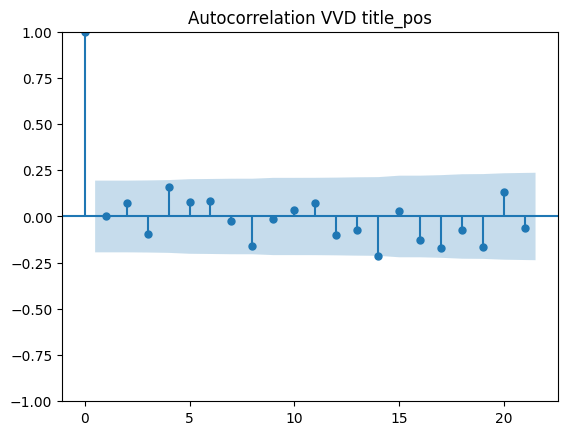

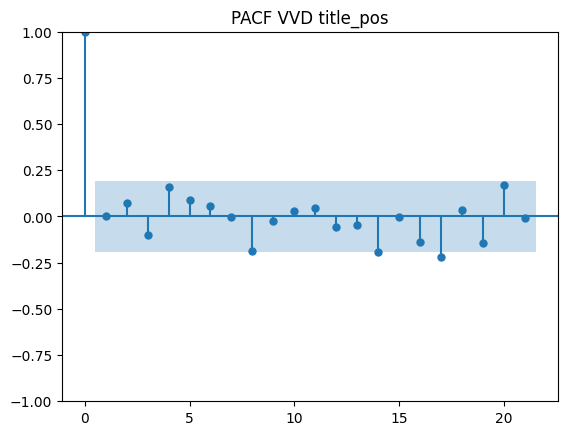

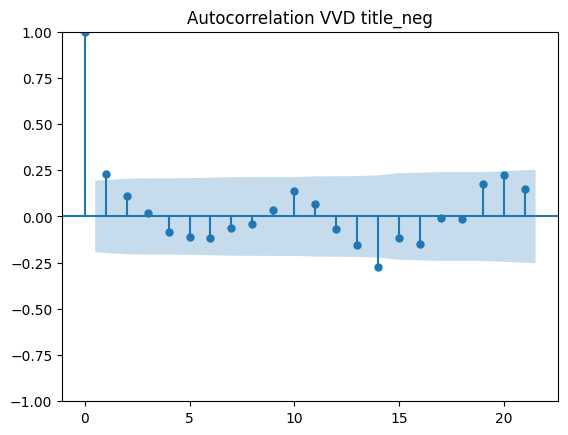

...

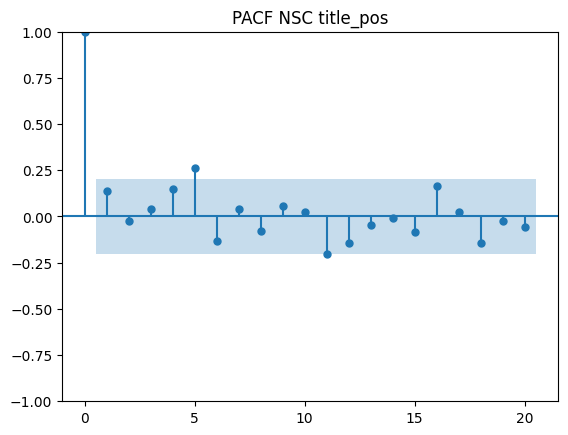

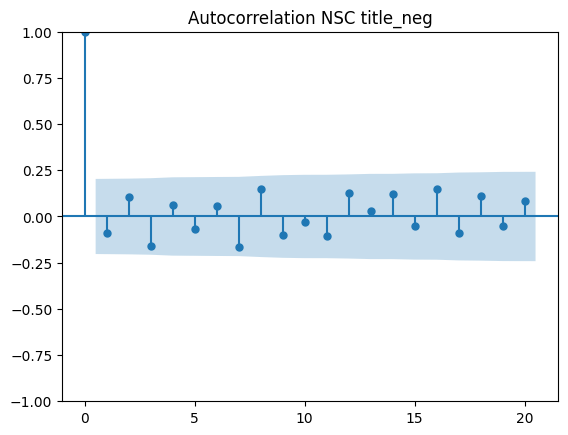

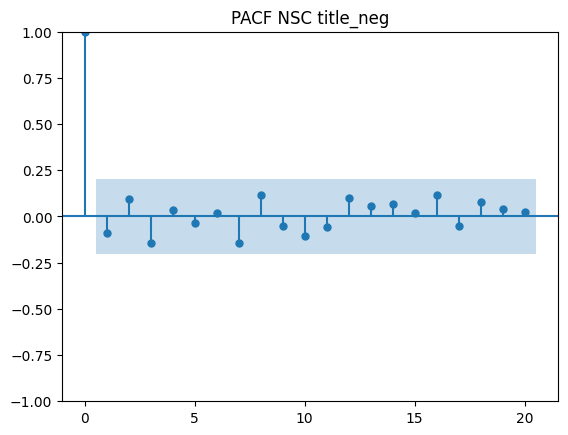

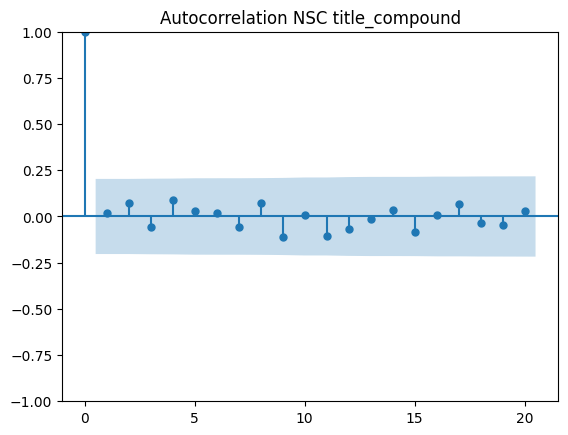

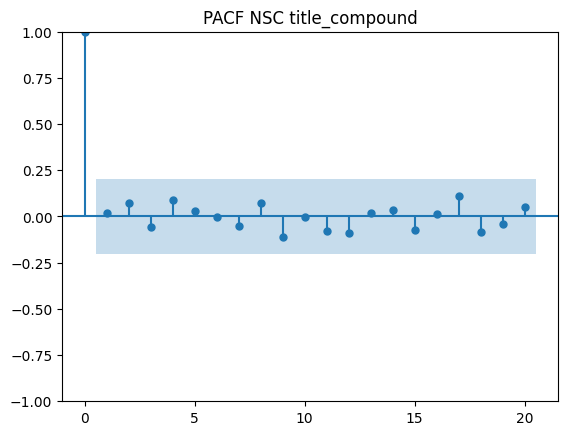

In [9]:
sentiments = ['title_neu', 'title_pos', 'title_neg', 'title_compound']

for party_data in parties:
    for sentiment in sentiments:
        try:
            plot_acf(party_sentiment[party_data][sentiment].dropna(), title=f"Autocorrelation {party_data} {sentiment}")
            plot_pacf(party_sentiment[party_data][sentiment].dropna(), title=f"PACF {party_data} {sentiment}")
        except ValueError:
            print(f"{party_data} has insufficient data for PACF")

In [10]:
def adfuller_test(name, party_data, type):
    result=adfuller(party_data, regression='ct')
    labels = ['ADF:','p-value:','N Lags:','N Observations', 'crit vals']
    print(f"{name} {type}")
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print(f"P value is less than 0.05 for {name} means we can reject the null hypothesis(Ho). We can conclude that data has no unit root and is stationary")
        return 0
    else:
        print(f"Weak evidence against null hypothesis for {name} means time series has a unit root which indicates that it is non-stationary ")
        return 1
    
for party in parties:
    for sentiment in sentiments:
        adfuller_test(party, party_sentiment[party][sentiment].dropna(), sentiment)
        print("")

VVD title_neu
ADF: : -8.267458973328164
p-value: : 1.7220978932141834e-11
N Lags: : 0
N Observations : 101
crit vals : {'1%': -4.051321648595896, '5%': -3.454889141998309, '10%': -3.1530564880069027}
P value is less than 0.05 for VVD means we can reject the null hypothesis(Ho). We can conclude that data has no unit root and is stationary

VVD title_pos
ADF: : -10.205992691601043
p-value: : 8.521898400209733e-16
N Lags: : 0
N Observations : 101
crit vals : {'1%': -4.051321648595896, '5%': -3.454889141998309, '10%': -3.1530564880069027}
P value is less than 0.05 for VVD means we can reject the null hypothesis(Ho). We can conclude that data has no unit root and is stationary

VVD title_neg
ADF: : -7.920360848200023
p-value: : 1.0917745440108712e-10
N Lags: : 0
N Observations : 101
crit vals : {'1%': -4.051321648595896, '5%': -3.454889141998309, '10%': -3.1530564880069027}
P value is less than 0.05 for VVD means we can reject the null hypothesis(Ho). We can conclude that data has no unit r

In [11]:
def kpss_test(name, party):
    result=kpss(party)
    labels = ['KPSS:','p-value:','N Lags:','crit values:']
    print(name)
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[0] >= result[3]['5%']:
        print(f"P value is less than 0.05 for {name} means we can reject the null hypothesis(Ho). We can conclude that the data is non-stationary")
        return 0
    else:
        print(f"Weak evidence against null hypothesis for {name} indicates that it is stationary ")
        return 1

for party_data in parties:
    for sentiment in sentiments:
        print(sentiment)
        kpss_test(party_data, party_sentiment[party_data][sentiment].dropna())
        print("")

title_neu
VVD
KPSS: : 0.1745829953963755
p-value: : 0.1
N Lags: : 3
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Weak evidence against null hypothesis for VVD indicates that it is stationary 

title_pos
VVD
KPSS: : 0.09690309659612084
p-value: : 0.1
N Lags: : 2
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Weak evidence against null hypothesis for VVD indicates that it is stationary 

title_neg
VVD
KPSS: : 0.12671188446640877
p-value: : 0.1
N Lags: : 3
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Weak evidence against null hypothesis for VVD indicates that it is stationary 

title_compound
VVD
KPSS: : 0.09265973092016681
p-value: : 0.1
N Lags: : 3
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Weak evidence against null hypothesis for VVD indicates that it is stationary 

title_neu
CDA
KPSS: : 0.770722431693031
p-value: : 0.01
N Lags: : 2
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%

/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/3212553297.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result=kpss(party)
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/3212553297.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result=kpss(party)
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/3212553297.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result=kpss(party)
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/3212553297.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table.

In [12]:
model_data = {}

for party_data in parties:
    model_data[party_data] = {}
    model_data[party_data]['train_data'] = party_sentiment[party_data]['title_neu'][:int((len(party_sentiment[party_data])+1)*.80)]
    model_data[party_data]['test_data'] = party_sentiment[party_data]['title_neu'][int((len(party_sentiment[party_data])+1)*.80):]

count    101.000000
mean       0.000078
std        0.060922
min       -0.172888
25%       -0.036395
50%       -0.000678
75%        0.038509
max        0.163461
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


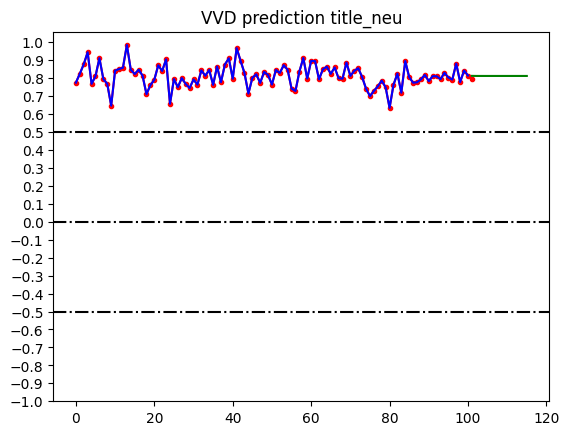

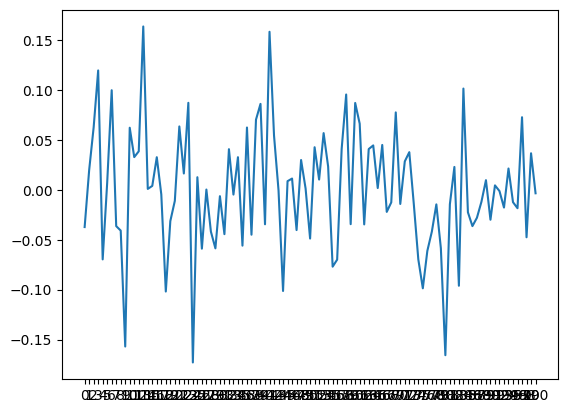

count    1.010000e+02
mean    -9.137355e-18
std      3.898613e-02
min     -8.743004e-02
25%     -2.313004e-02
50%     -5.411465e-04
75%      1.881996e-02
max      1.256489e-01
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


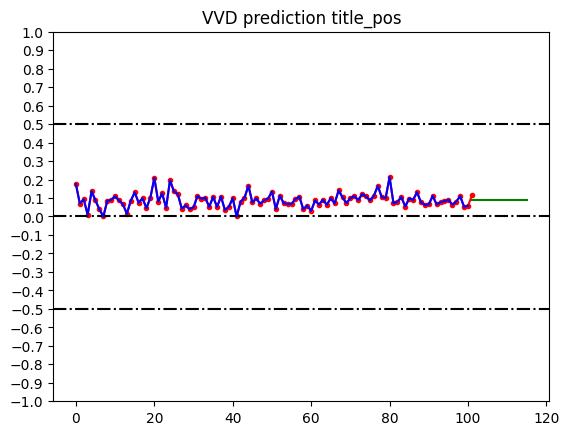

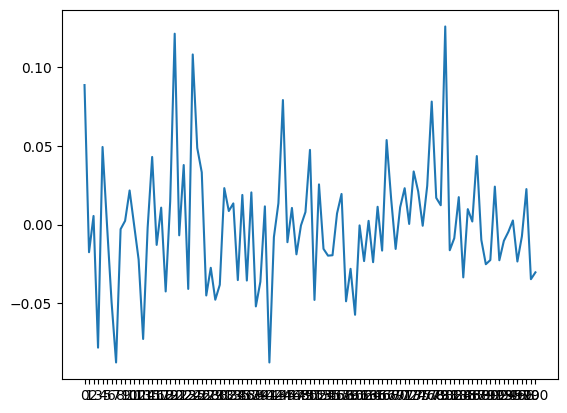

count    101.000000
mean       0.000119
std        0.049063
min       -0.107636
25%       -0.034192
50%       -0.004161
75%        0.030179
max        0.152783
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


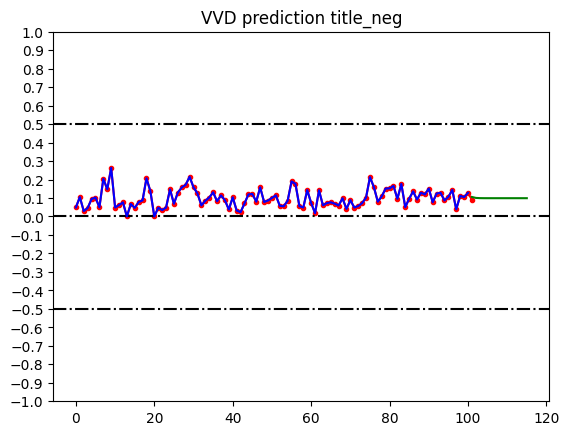

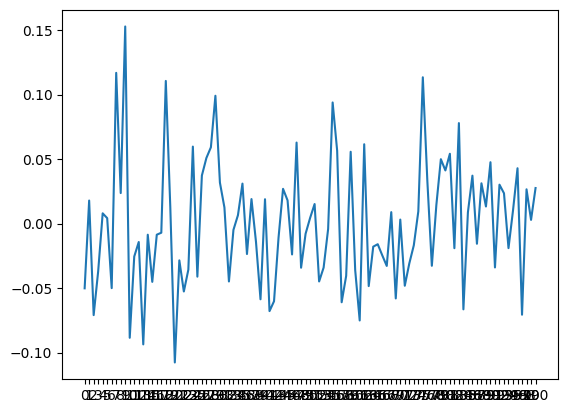

count    101.000000
mean      -0.012994
std        0.124231
min       -0.332013
25%       -0.085952
50%       -0.005428
75%        0.069077
max        0.317409
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


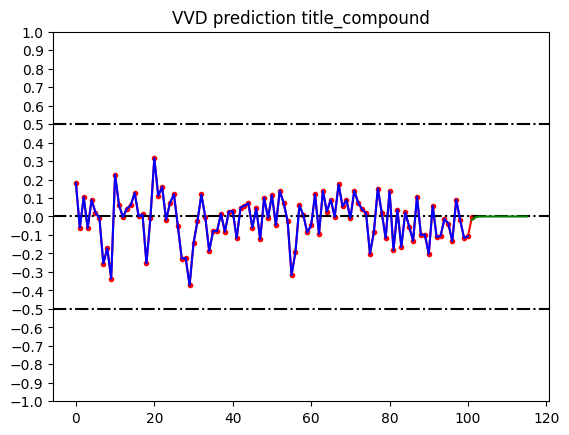

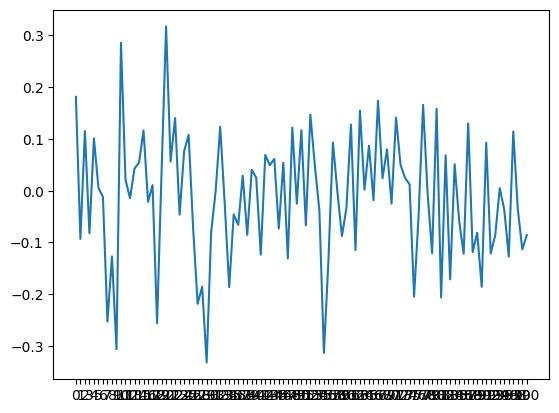

count    100.000000
mean       0.011530
std        0.094779
min       -0.129238
25%       -0.023472
50%       -0.001532
75%        0.031196
max        0.741955
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


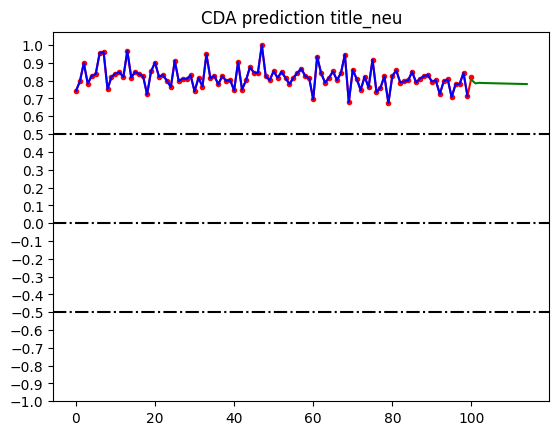

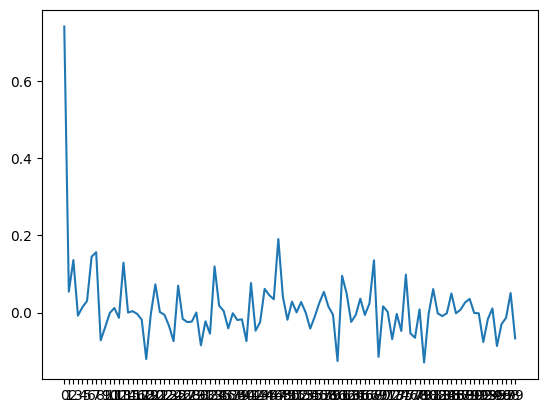

count    1.000000e+02
mean     2.459058e-12
std      4.489850e-02
min     -9.542523e-02
25%     -2.514745e-02
50%     -5.731639e-03
75%      2.556287e-02
max      1.456748e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


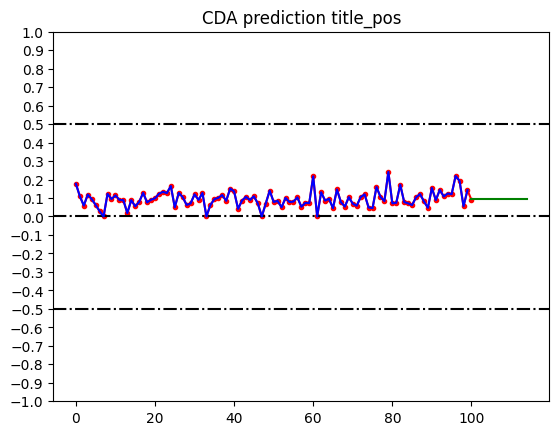

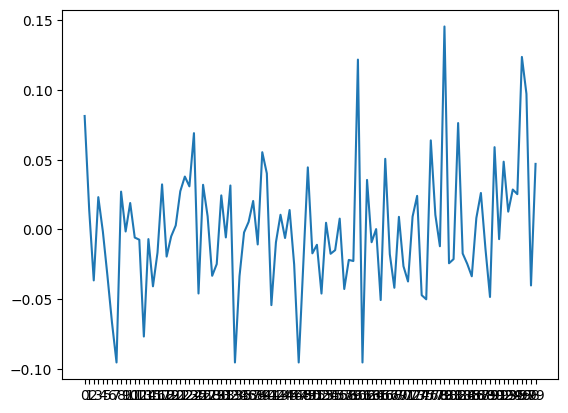

count    100.000000
mean      -0.000003
std        0.041444
min       -0.091294
25%       -0.025692
50%        0.002194
75%        0.021681
max        0.114452
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


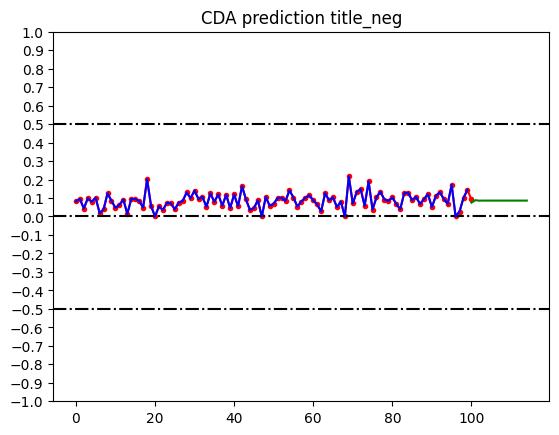

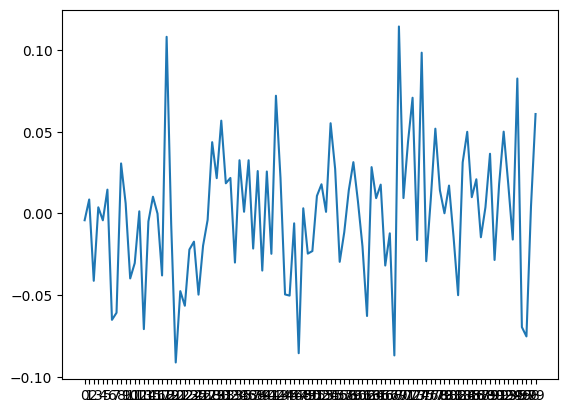

count    1.000000e+02
mean     1.477063e-10
std      1.198140e-01
min     -3.101819e-01
25%     -6.398998e-02
50%     -1.779711e-02
75%      6.707237e-02
max      3.944646e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


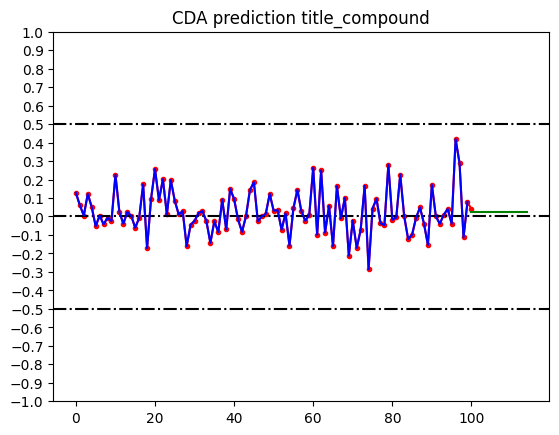

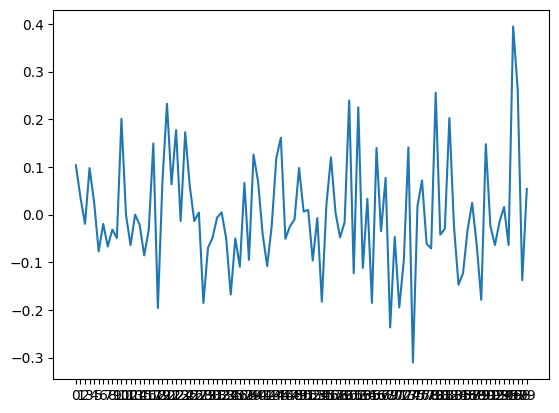

count    9.800000e+01
mean     3.787198e-11
std      7.449030e-02
min     -3.103360e-01
25%     -4.399223e-02
50%     -1.635088e-03
75%      4.012830e-02
max      1.716640e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


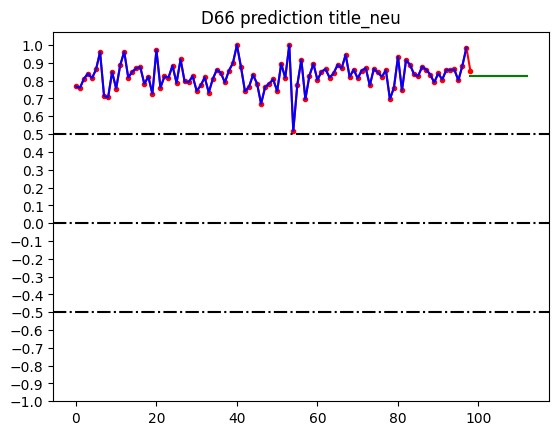

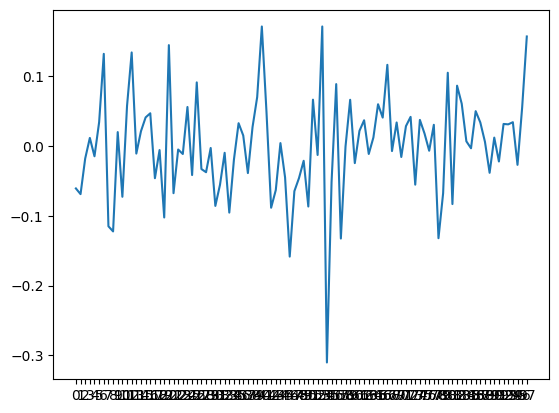

count    9.800000e+01
mean     1.047914e-11
std      5.011572e-02
min     -8.237600e-02
25%     -3.247600e-02
50%     -2.424149e-03
75%      2.318491e-02
max      1.916240e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


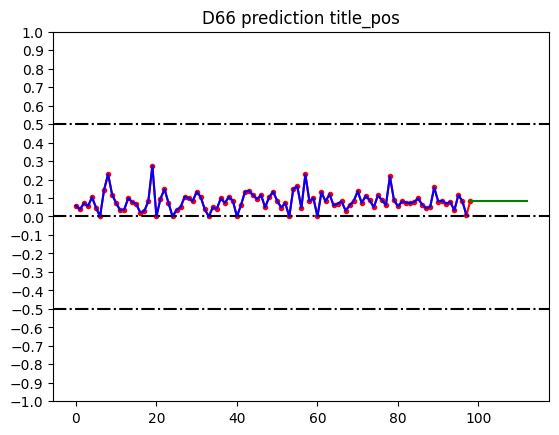

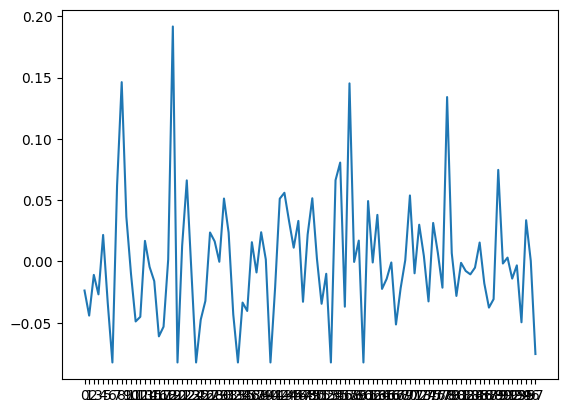

count    9.800000e+01
mean     2.579954e-11
std      5.969399e-02
min     -8.929666e-02
25%     -3.806452e-02
50%     -6.431277e-03
75%      2.807834e-02
max      2.440367e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


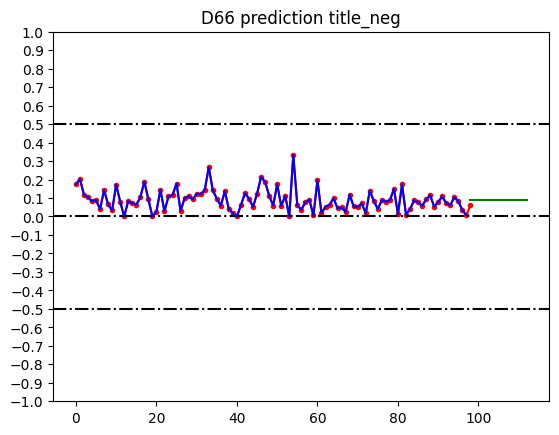

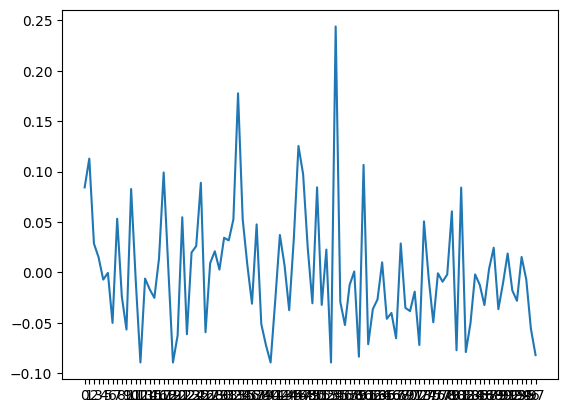

count    98.000000
mean     -0.001438
std       0.146593
min      -0.612400
25%      -0.082215
50%       0.000000
75%       0.085709
max       0.340000
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


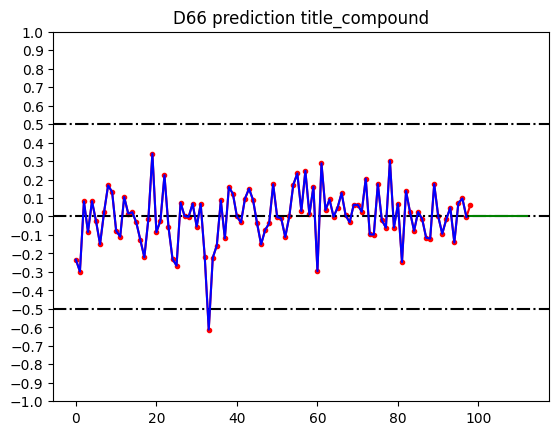

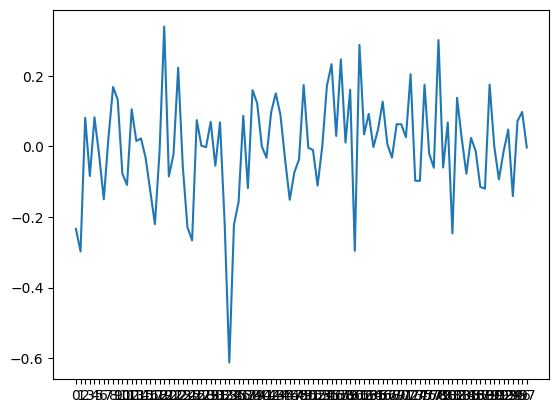

count    86.000000
mean      0.013096
std       0.144909
min      -0.359325
25%      -0.042054
50%       0.027760
75%       0.078592
max       0.929366
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


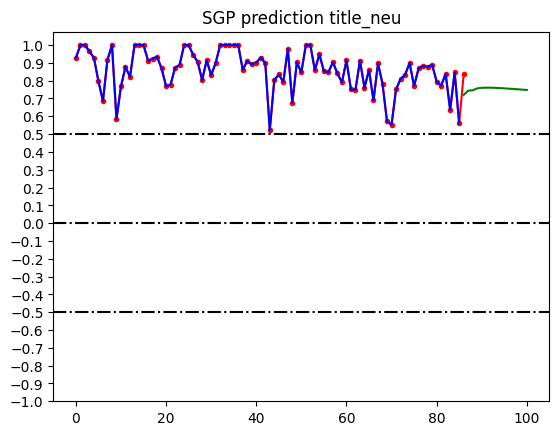

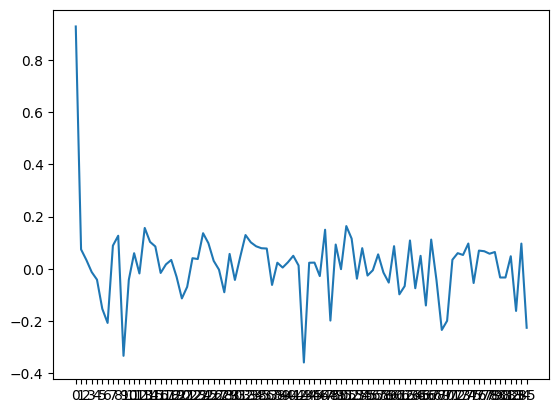

count    8.600000e+01
mean     1.121821e-10
std      9.977253e-02
min     -8.832902e-02
25%     -8.832902e-02
50%     -1.582902e-02
75%      3.424598e-02
max      3.896710e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


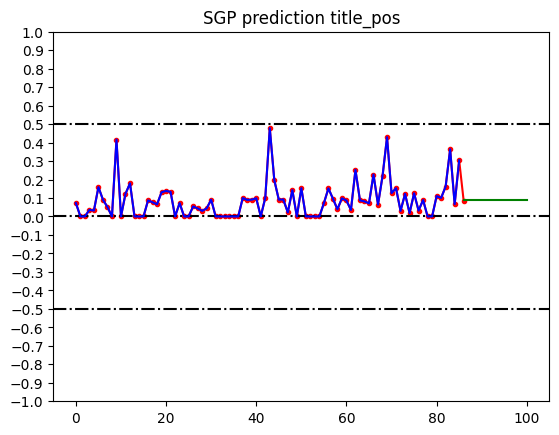

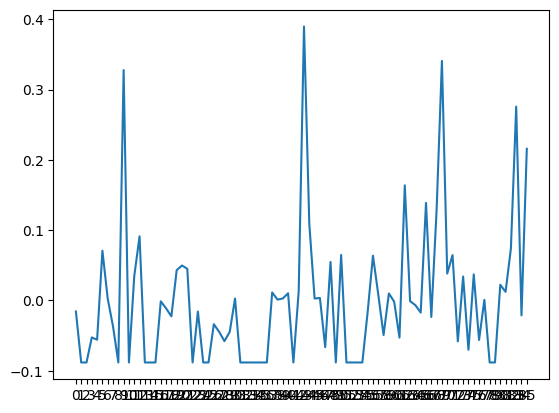

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


count    86.000000
mean     -0.000931
std       0.066549
min      -0.088085
25%      -0.054386
50%      -0.016517
75%       0.033957
max       0.244235
dtype: float64


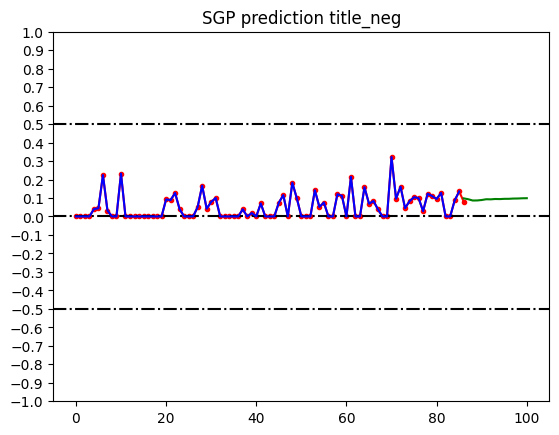

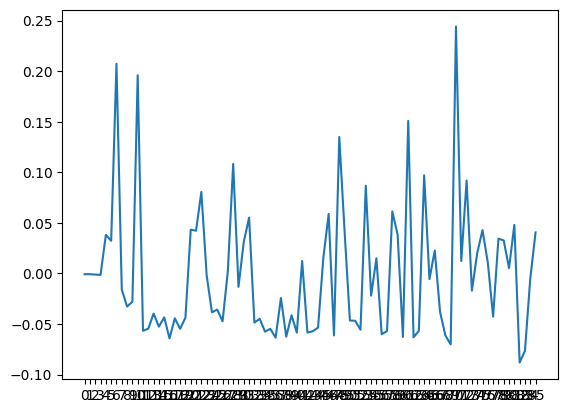

count    8.600000e+01
mean     1.777967e-12
std      2.430057e-01
min     -5.684242e-01
25%     -8.893848e-02
50%     -4.597169e-02
75%      1.067058e-01
max      6.867758e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


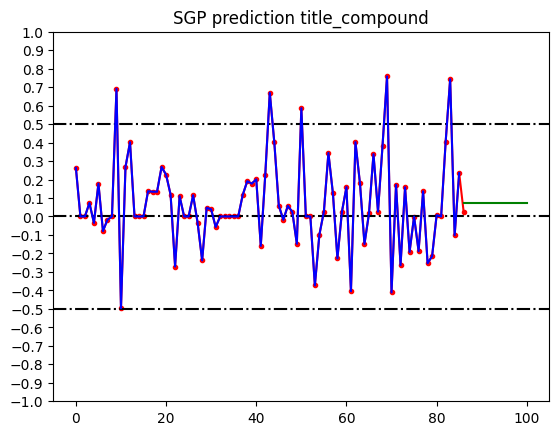

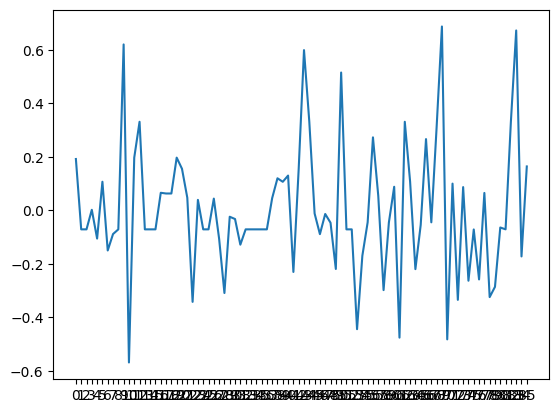

count    1.010000e+02
mean    -4.396923e-18
std      5.543802e-02
min     -1.297165e-01
25%     -3.432717e-02
50%     -4.001353e-03
75%      3.987759e-02
max      1.725776e-01
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


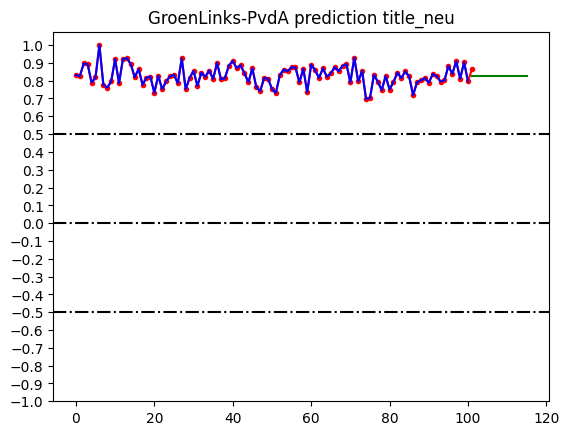

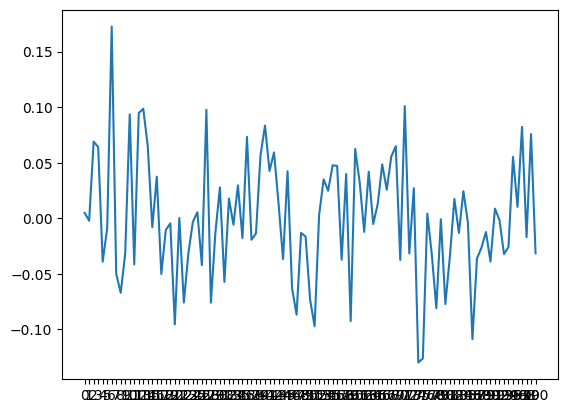

count    1.010000e+02
mean     3.339681e-11
std      4.009851e-02
min     -8.571545e-02
25%     -2.471545e-02
50%     -2.628492e-03
75%      2.099884e-02
max      1.691081e-01
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


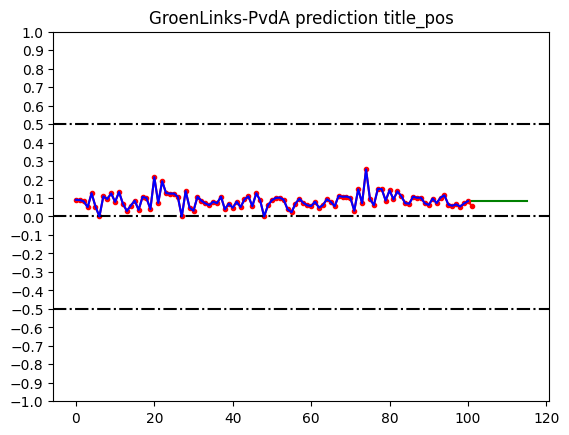

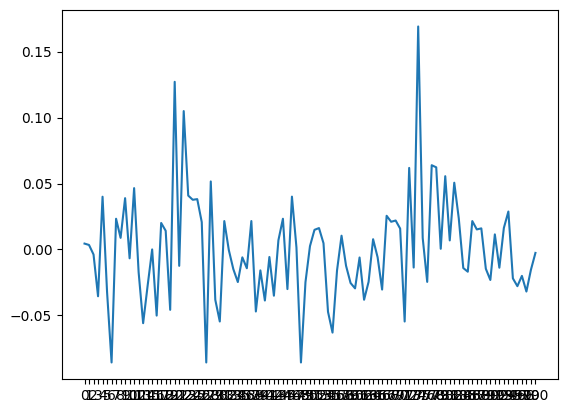

count    101.000000
mean      -0.001356
std        0.040248
min       -0.098544
25%       -0.030878
50%       -0.001388
75%        0.024868
max        0.108652
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


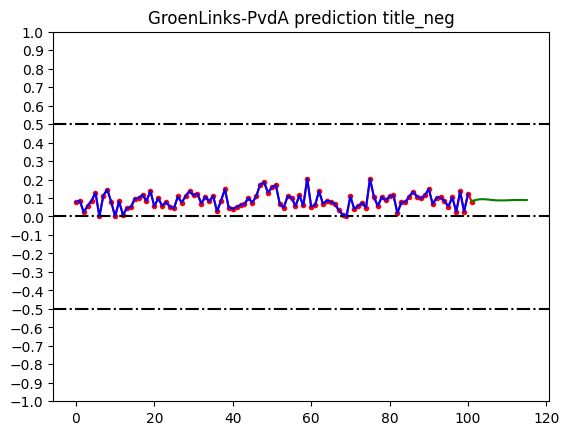

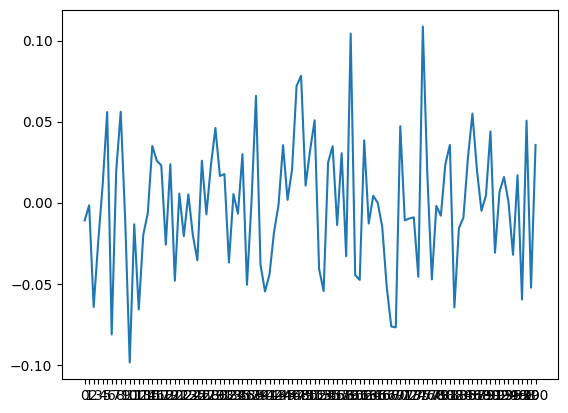

count    101.000000
mean       0.008105
std        0.122840
min       -0.324533
25%       -0.070367
50%        0.005980
75%        0.085029
max        0.392547
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


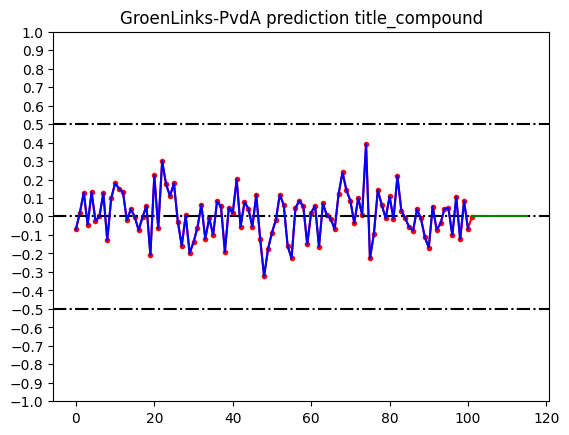

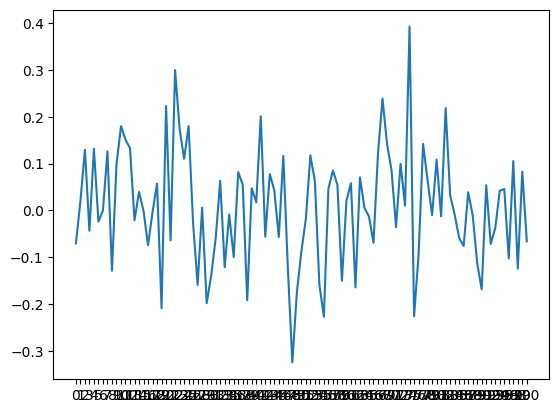

count    9.600000e+01
mean     5.155173e-11
std      9.510724e-02
min     -5.035193e-01
25%     -4.241511e-02
50%      3.414054e-03
75%      4.931554e-02
max      1.794807e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


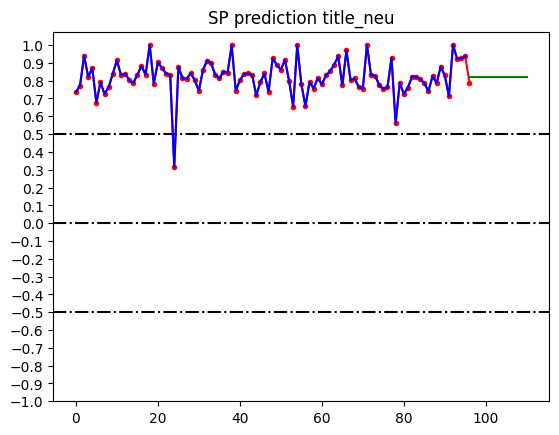

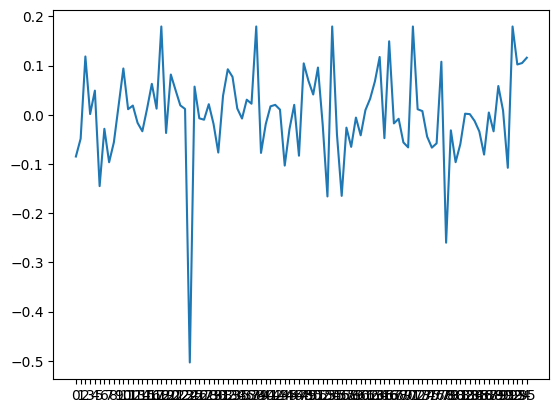

count    9.600000e+01
mean     4.157916e-11
std      6.615501e-02
min     -9.504771e-02
25%     -4.156854e-02
50%     -6.647707e-03
75%      3.367729e-02
max      2.242856e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


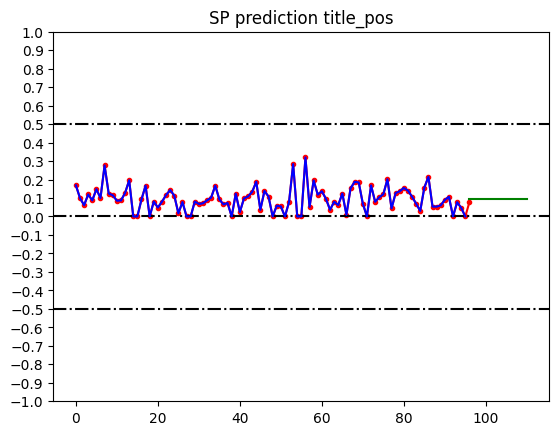

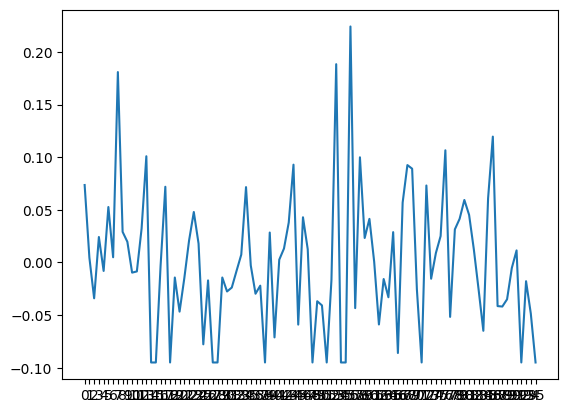

count    9.600000e+01
mean     6.108276e-12
std      8.047875e-02
min     -8.443902e-02
25%     -5.323068e-02
50%     -1.228902e-02
75%      3.574848e-02
max      4.855610e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


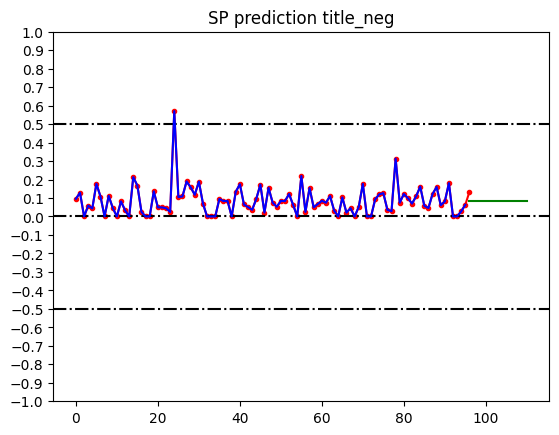

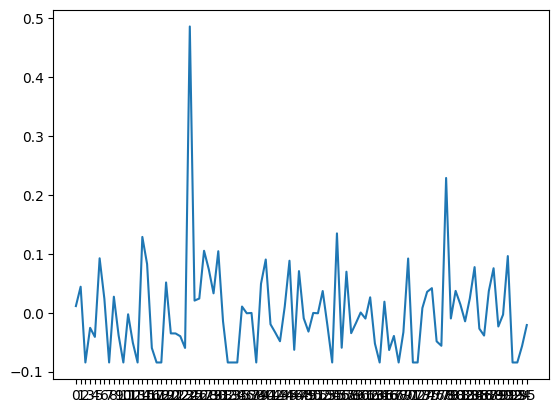

count    9.600000e+01
mean     8.935994e-13
std      2.106475e-01
min     -9.533449e-01
25%     -1.193324e-01
50%     -1.058134e-03
75%      1.314238e-01
max      6.021551e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


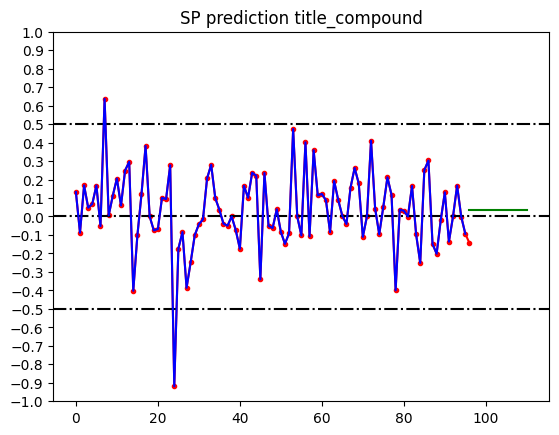

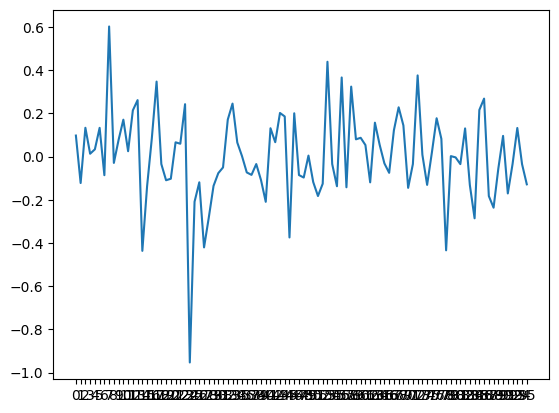

count    8.700000e+01
mean     6.649490e-12
std      1.140536e-01
min     -3.991469e-01
25%     -6.968857e-02
50%      1.225310e-02
75%      7.710310e-02
max      1.738531e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


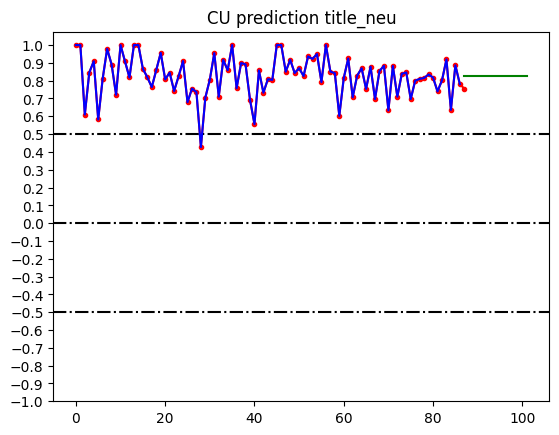

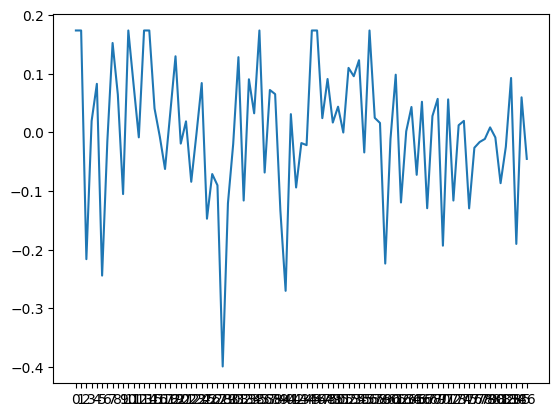

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


count    87.000000
mean      0.003226
std       0.077120
min      -0.130885
25%      -0.052168
50%      -0.006873
75%       0.047926
max       0.277003
dtype: float64


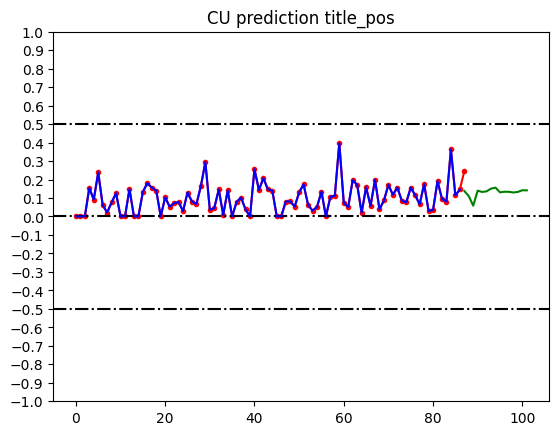

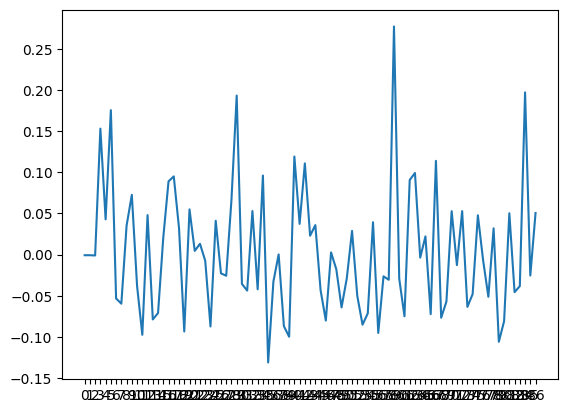

count    87.000000
mean      0.000587
std       0.080368
min      -0.150988
25%      -0.051270
50%      -0.007594
75%       0.034341
max       0.329737
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


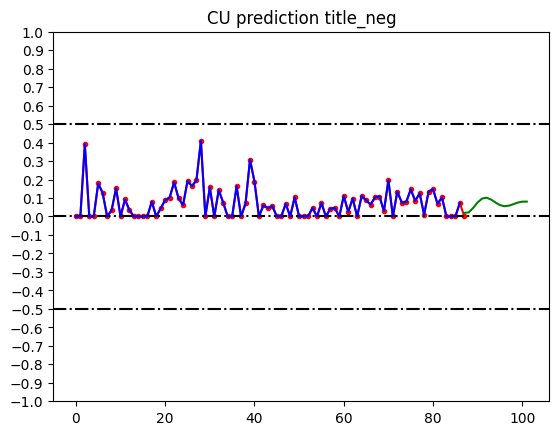

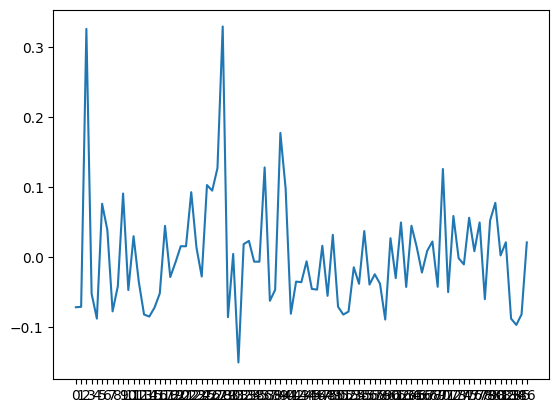

count    8.700000e+01
mean     1.661801e-11
std      2.302809e-01
min     -6.816644e-01
25%     -1.229644e-01
50%     -3.066441e-02
75%      1.422606e-01
max      6.737356e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


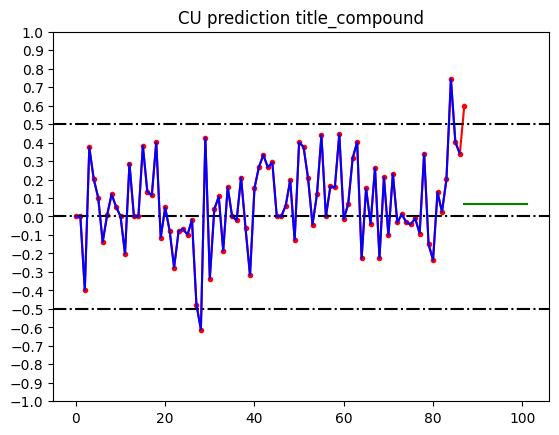

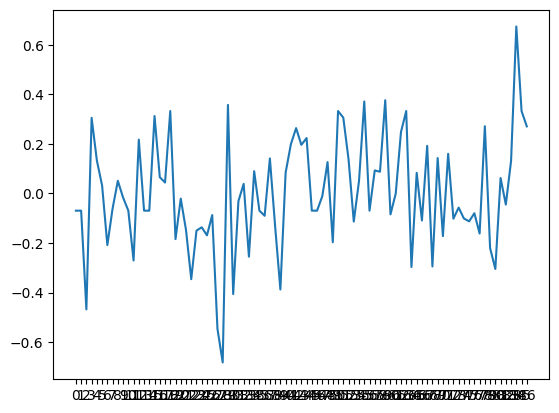

count    8.600000e+01
mean     1.006330e-11
std      1.128020e-01
min     -3.836619e-01
25%     -7.221189e-02
50%     -5.785565e-04
75%      6.159704e-02
max      1.893381e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


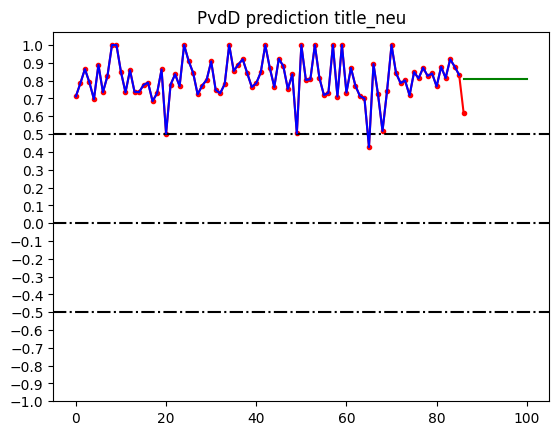

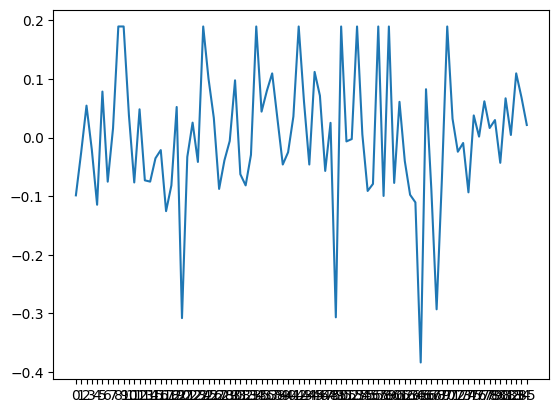

count    86.000000
mean      0.000142
std       0.078005
min      -0.113548
25%      -0.051748
50%      -0.014658
75%       0.047263
max       0.271452
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


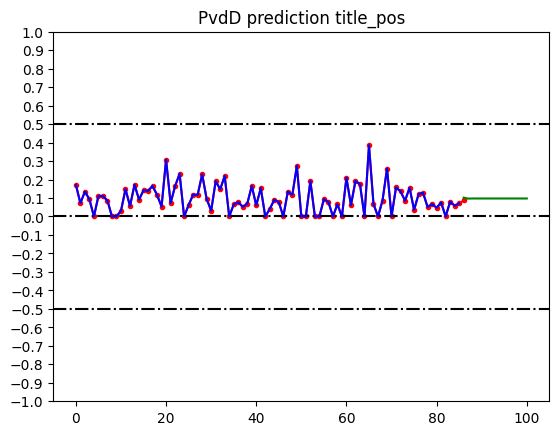

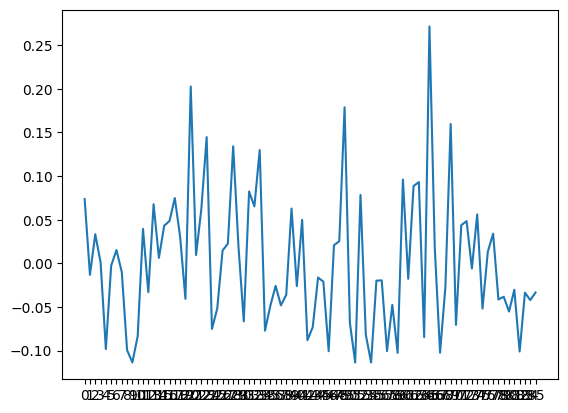

count    8.600000e+01
mean     1.257130e-11
std      8.351563e-02
min     -9.191312e-02
25%     -9.191312e-02
50%     -7.430982e-03
75%      5.224938e-02
max      3.044202e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


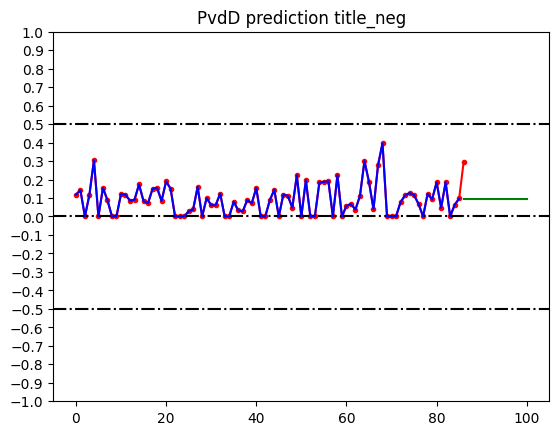

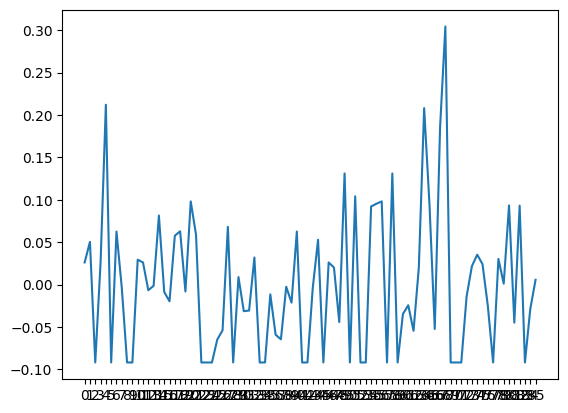

count    86.000000
mean      0.009672
std       0.224439
min      -0.615557
25%      -0.102874
50%       0.014473
75%       0.139545
max       0.610421
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


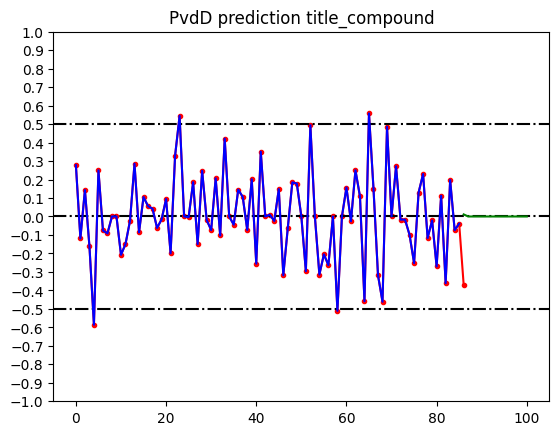

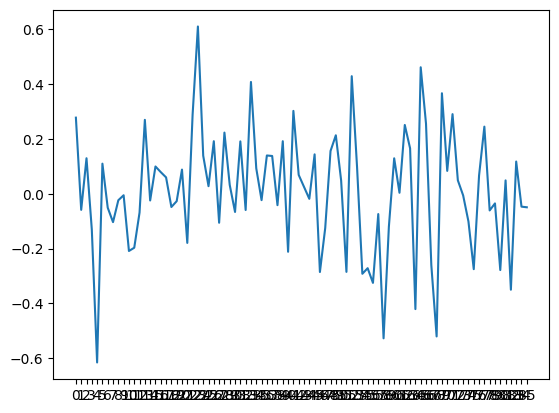

count    9.700000e+01
mean     3.223134e-11
std      1.022238e-01
min     -5.080999e-01
25%     -4.981420e-02
50%      4.150082e-03
75%      5.773342e-02
max      1.889001e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


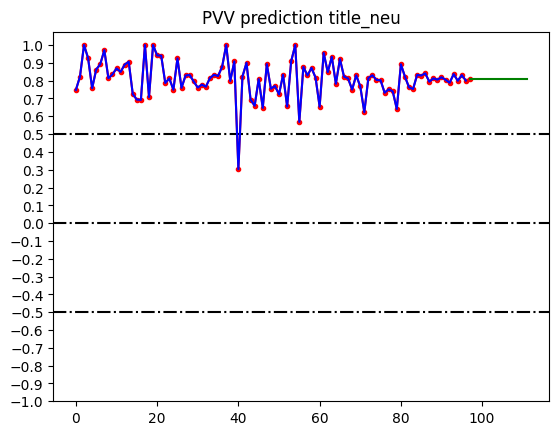

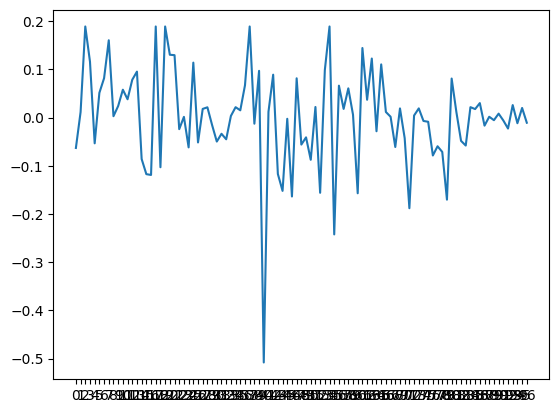

count    97.000000
mean      0.001723
std       0.064822
min      -0.130047
25%      -0.043982
50%      -0.002760
75%       0.041590
max       0.219725
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


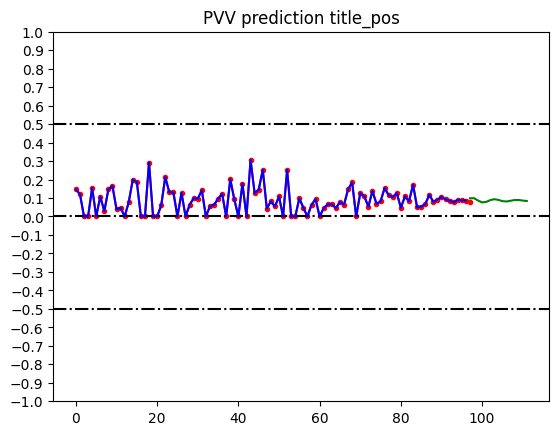

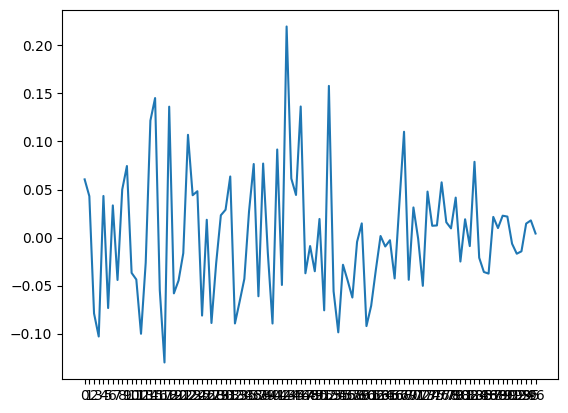

count    9.700000e+01
mean     1.085022e-11
std      9.561197e-02
min     -1.010450e-01
25%     -4.454499e-02
50%     -8.044995e-03
75%      2.490237e-02
max      5.959550e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


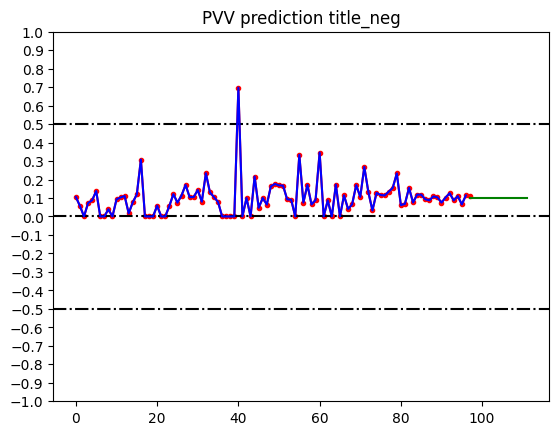

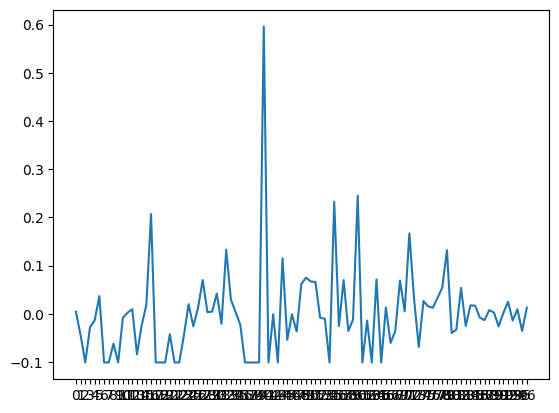

count    97.000000
mean     -0.010298
std       0.217321
min      -0.670500
25%      -0.129962
50%       0.000000
75%       0.132971
max       0.526700
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


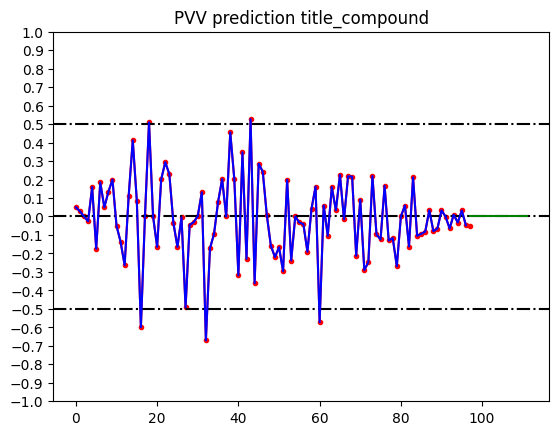

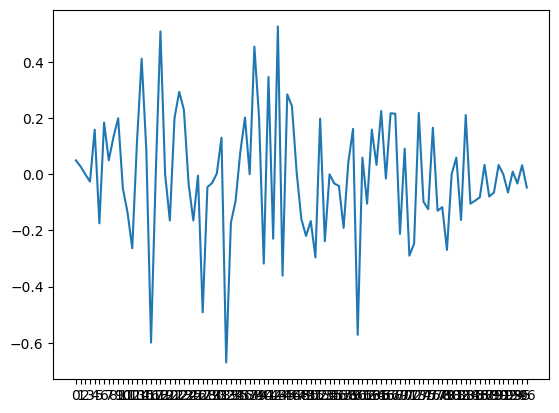

count    2.900000e+01
mean     4.605579e-11
std      1.691742e-01
min     -4.108333e-01
25%     -9.083333e-02
50%      1.516667e-02
75%      1.391667e-01
max      2.281667e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


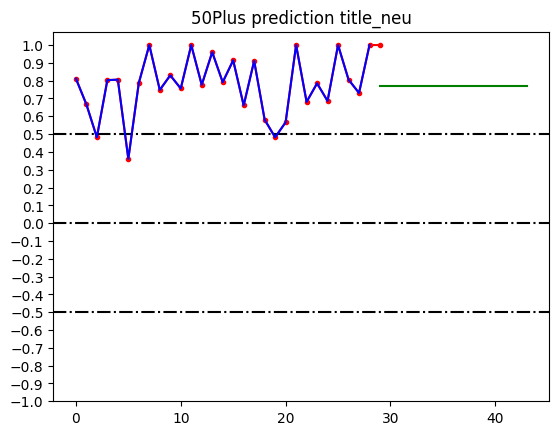

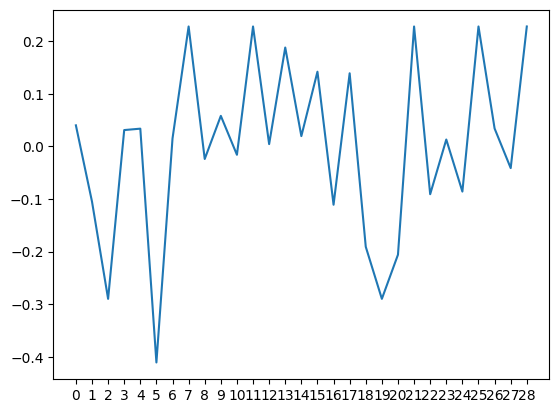

count    2.900000e+01
mean     2.319113e-11
std      1.124186e-01
min     -1.066408e-01
25%     -1.066408e-01
50%     -1.764080e-02
75%      1.985920e-02
max      2.543592e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


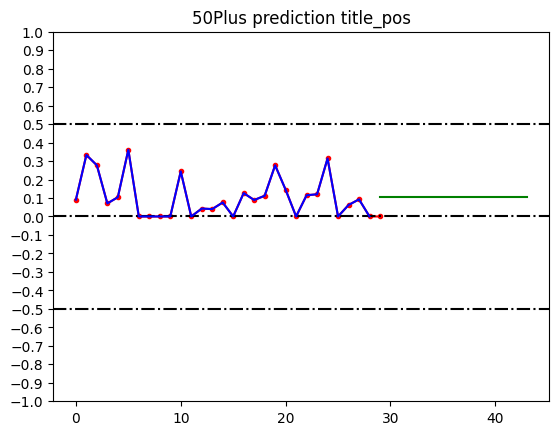

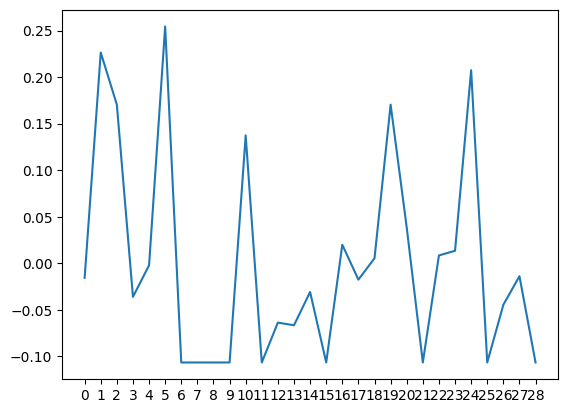

count    2.900000e+01
mean     2.571698e-15
std      1.063546e-01
min     -1.215661e-01
25%     -1.215661e-01
50%      4.933908e-03
75%      9.143391e-02
max      1.854339e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


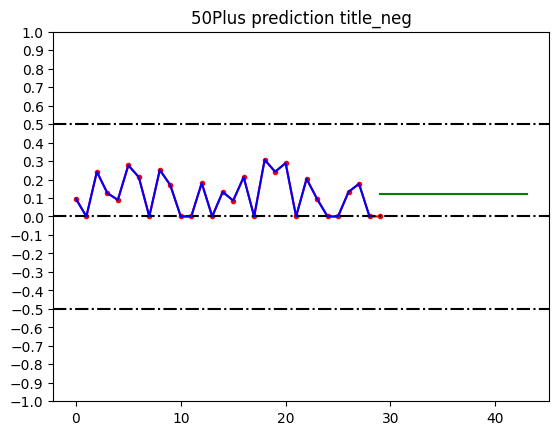

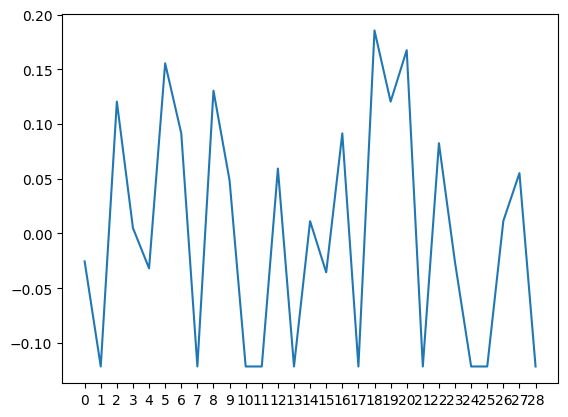

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


count    29.000000
mean     -0.055369
std       0.270056
min      -0.571900
25%      -0.246650
50%       0.000000
75%       0.075400
max       0.493900
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


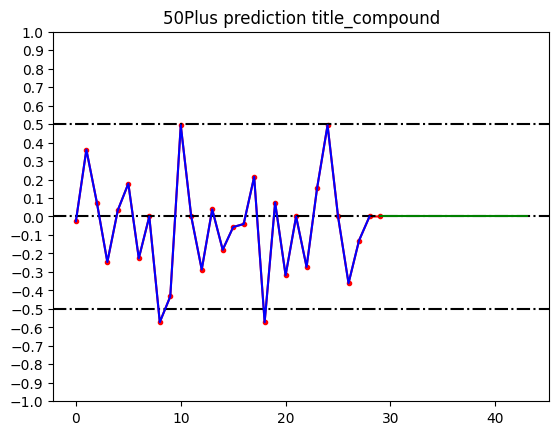

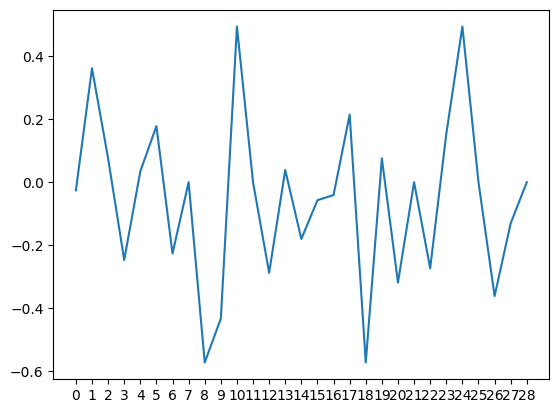

count    9.700000e+01
mean     2.243302e-11
std      9.327113e-02
min     -2.951869e-01
25%     -6.818692e-02
50%      1.081308e-02
75%      6.061308e-02
max      1.828131e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


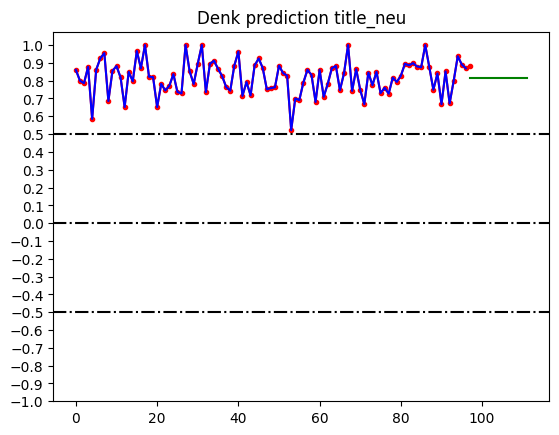

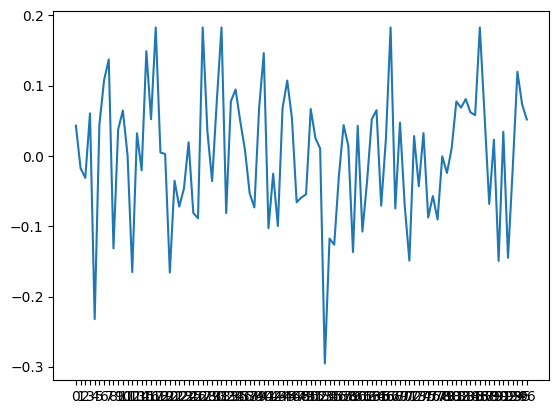

count    9.700000e+01
mean     5.373696e-11
std      5.863799e-02
min     -7.828711e-02
25%     -3.662044e-02
50%     -6.087105e-03
75%      3.721289e-02
max      1.847129e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


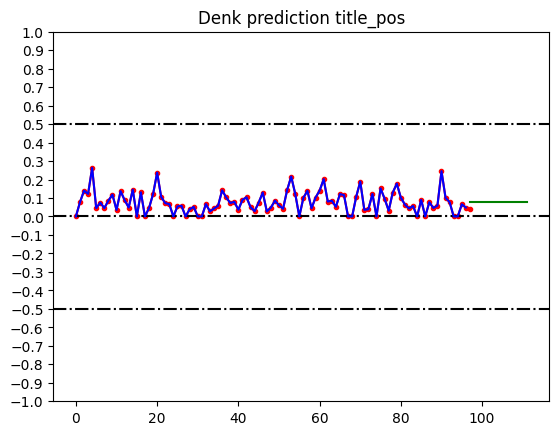

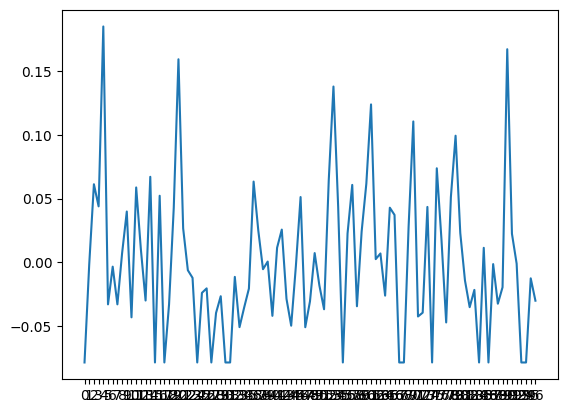

count    9.700000e+01
mean     2.245270e-12
std      7.950873e-02
min     -1.044996e-01
25%     -6.099962e-02
50%     -1.149962e-02
75%      4.725038e-02
max      2.045004e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


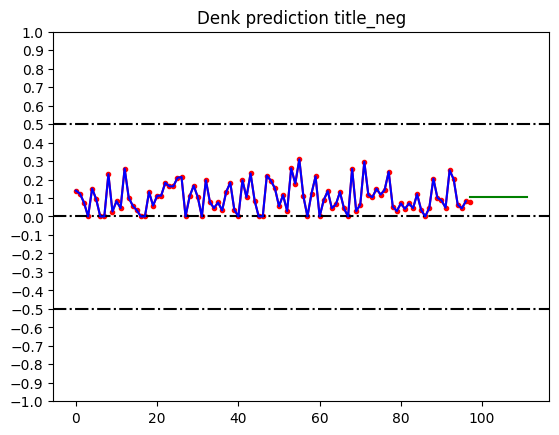

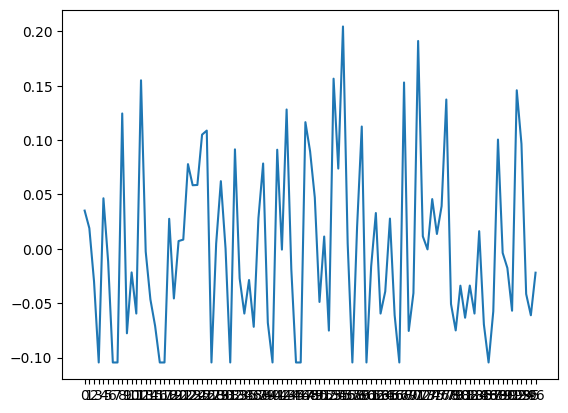

count    97.000000
mean     -0.000341
std       0.200940
min      -0.526784
25%      -0.088091
50%       0.010954
75%       0.158278
max       0.406291
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


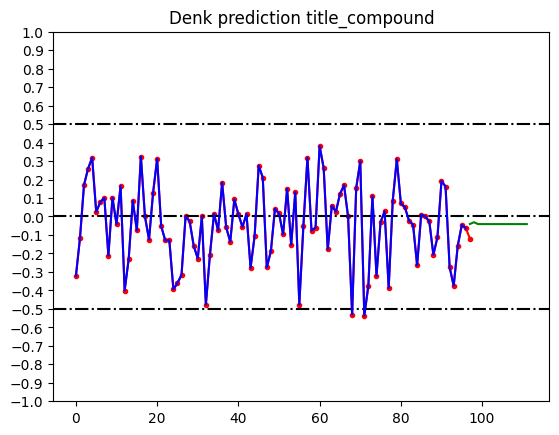

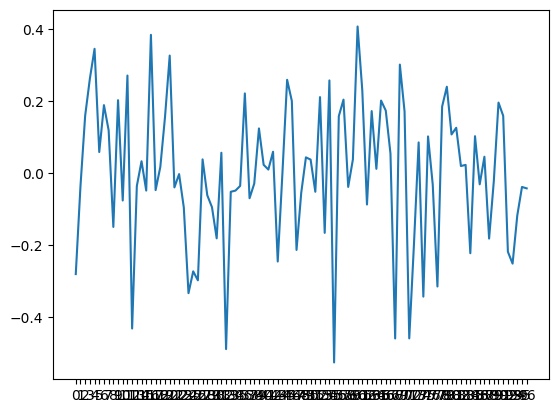

count    7.500000e+01
mean     1.733464e-12
std      1.580751e-01
min     -8.049804e-01
25%     -6.273039e-02
50%      1.601961e-02
75%      8.351961e-02
max      1.950196e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


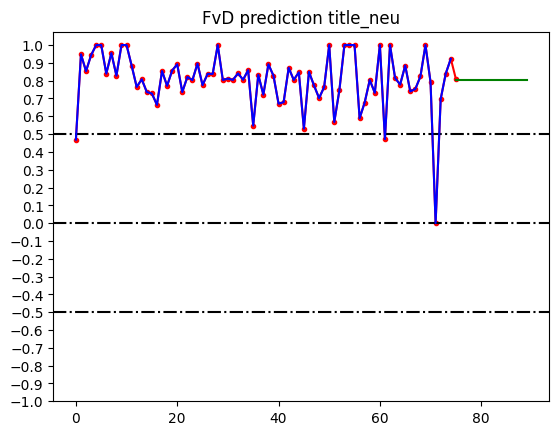

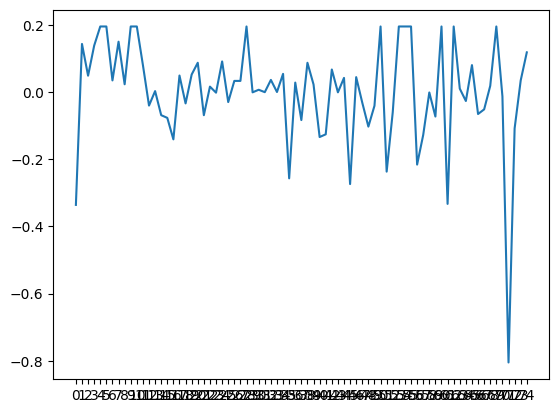

count    7.500000e+01
mean     6.924660e-12
std      9.202584e-02
min     -8.492418e-02
25%     -8.492418e-02
50%     -2.392418e-02
75%      6.871219e-02
max      2.920758e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


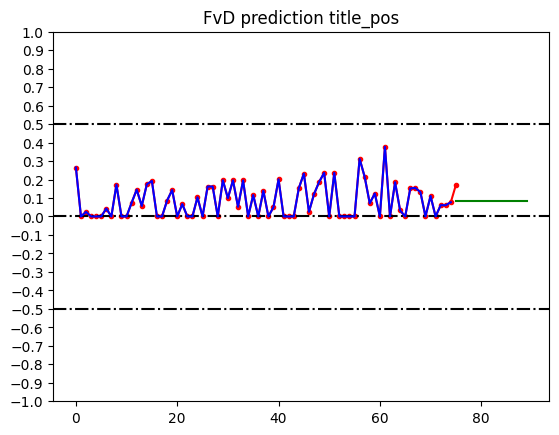

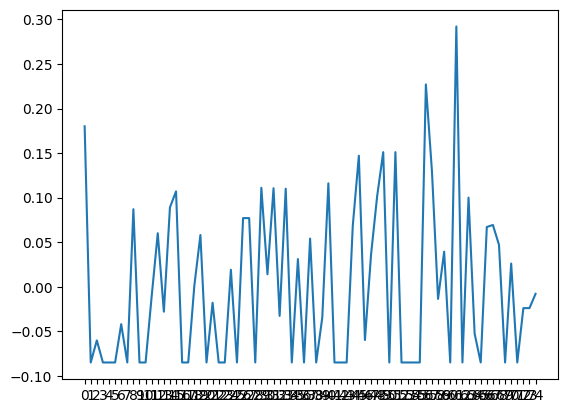

count    7.500000e+01
mean     1.052390e-10
std      1.374075e-01
min     -1.101003e-01
25%     -1.101003e-01
50%     -3.957472e-03
75%      3.323300e-02
max      8.898997e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


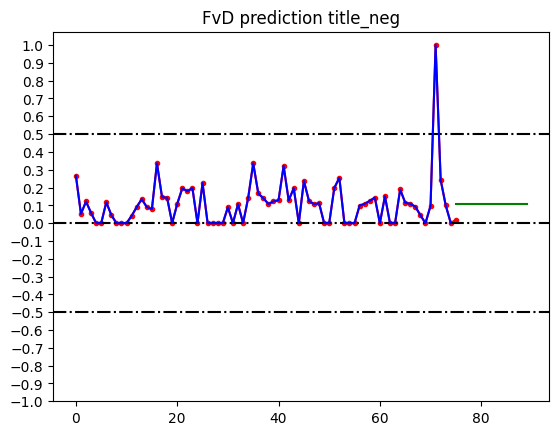

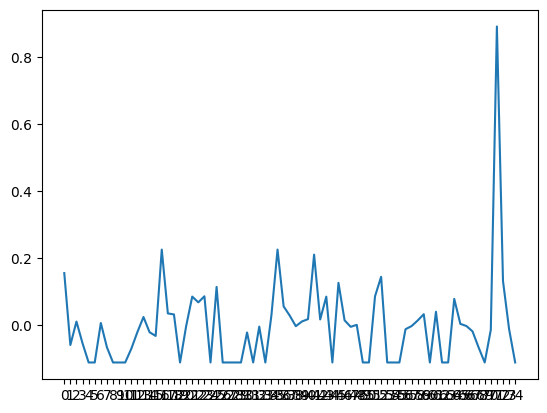

count    75.000000
mean     -0.023473
std       0.299895
min      -0.822500
25%      -0.219180
50%       0.000000
75%       0.181430
max       0.675700
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


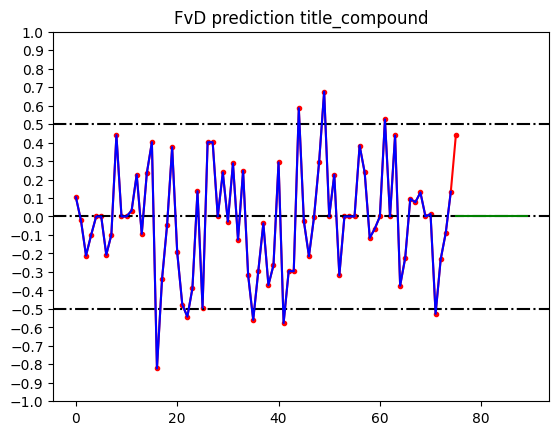

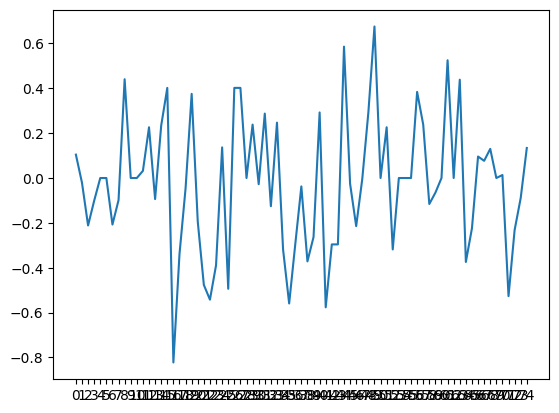

count    33.000000
mean      0.000346
std       0.129892
min      -0.298328
25%      -0.073933
50%       0.033991
75%       0.069698
max       0.227371
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


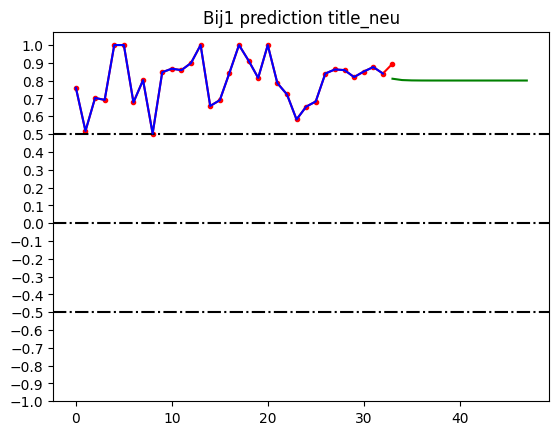

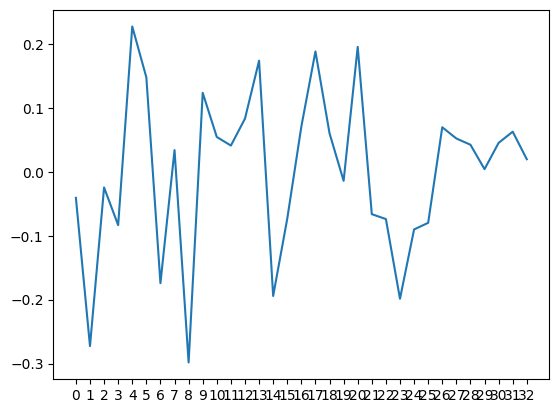

count    3.300000e+01
mean     6.909604e-12
std      9.499583e-02
min     -9.840202e-02
25%     -9.840202e-02
50%      2.597980e-03
75%      5.859798e-02
max      2.185980e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


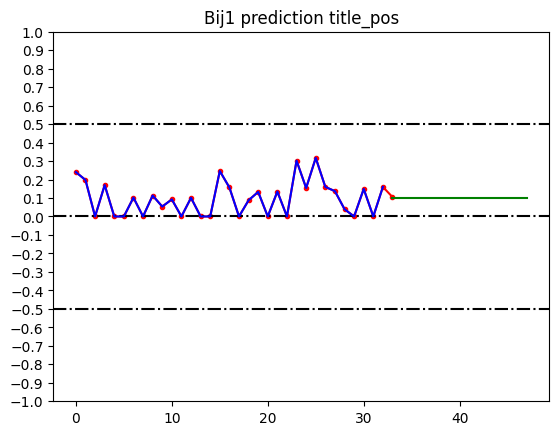

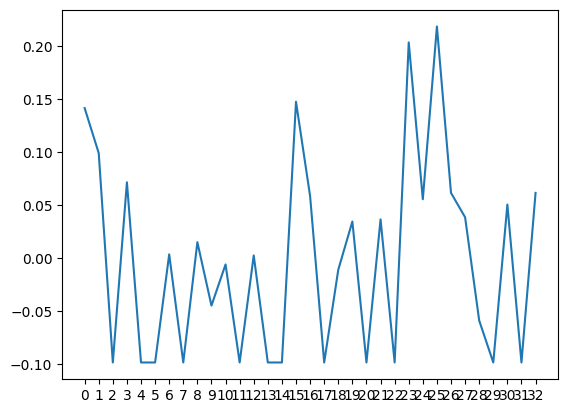

count    3.300000e+01
mean     1.145381e-10
std      1.163955e-01
min     -1.008167e-01
25%     -1.008167e-01
50%     -3.731667e-02
75%      7.918333e-02
max      2.826833e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


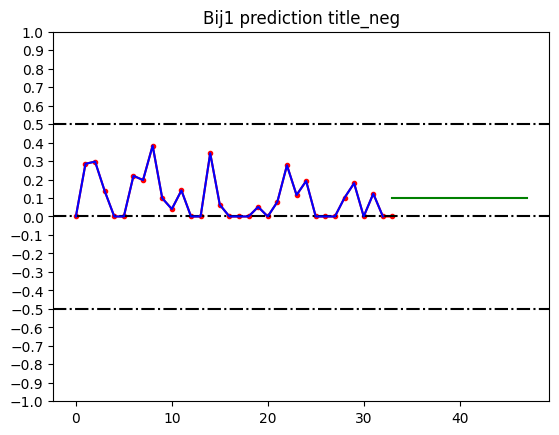

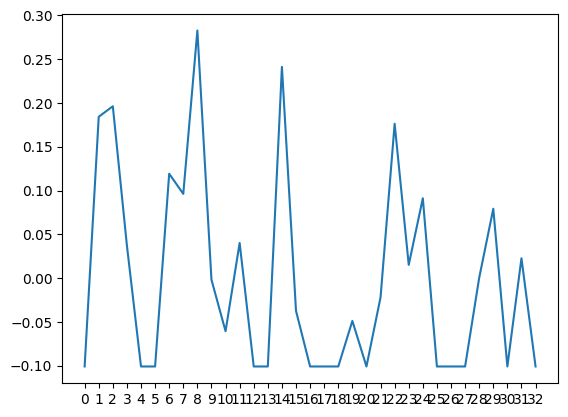

count    33.000000
mean      0.035173
std       0.322367
min      -0.585900
25%      -0.202300
50%       0.000000
75%       0.267250
max       0.690100
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


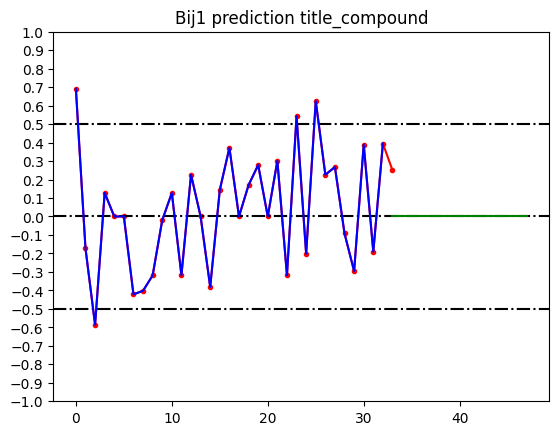

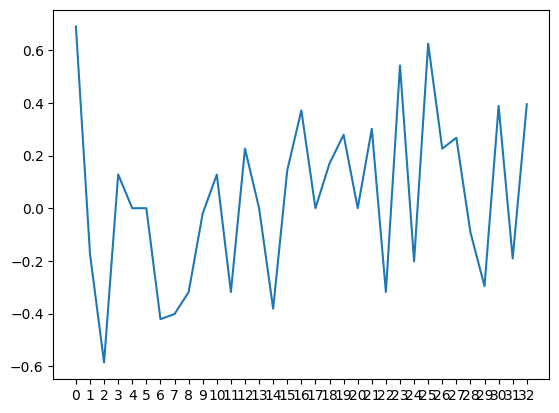

count    9.600000e+01
mean     6.427184e-12
std      8.227813e-02
min     -1.987387e-01
25%     -4.782623e-02
50%      4.557129e-04
75%      5.840294e-02
max      1.698613e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


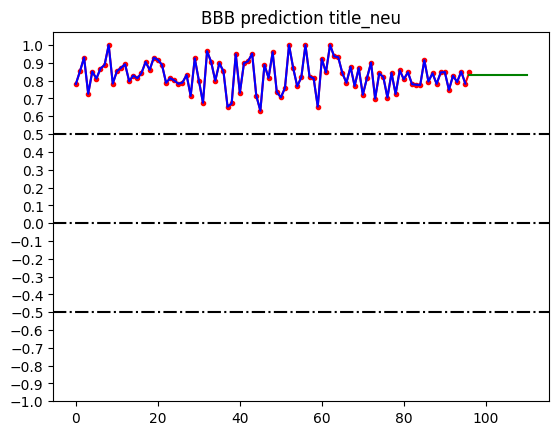

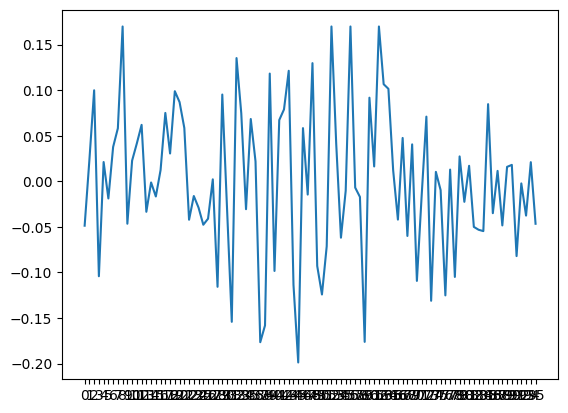

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


count    9.600000e+01
mean     8.135409e-12
std      6.560854e-02
min     -7.981923e-02
25%     -4.409066e-02
50%     -1.308173e-02
75%      3.595458e-02
max      2.665141e-01
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


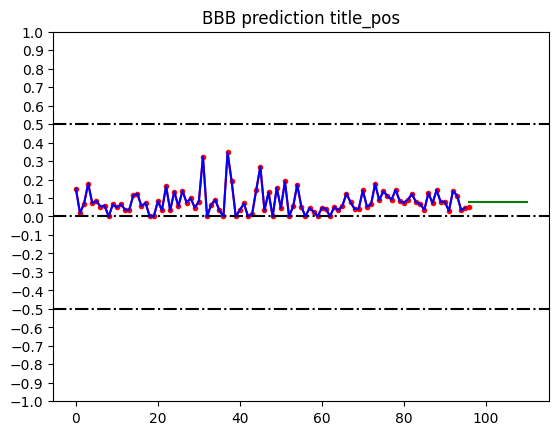

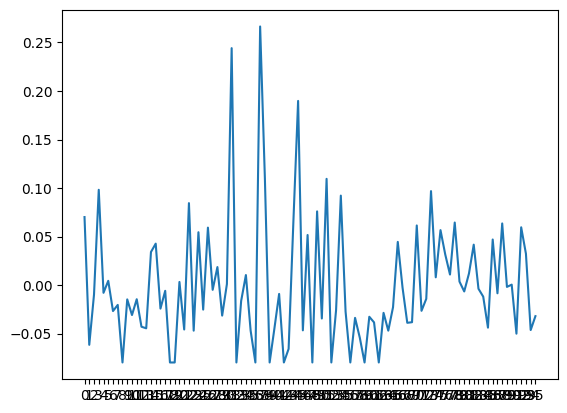

count    96.000000
mean     -0.000091
std       0.059098
min      -0.110048
25%      -0.032934
50%      -0.011420
75%       0.027186
max       0.255130
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


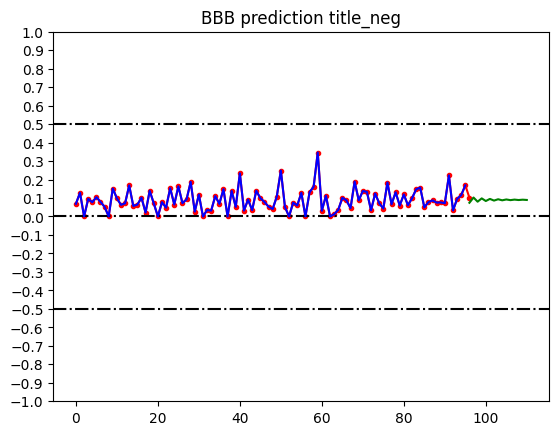

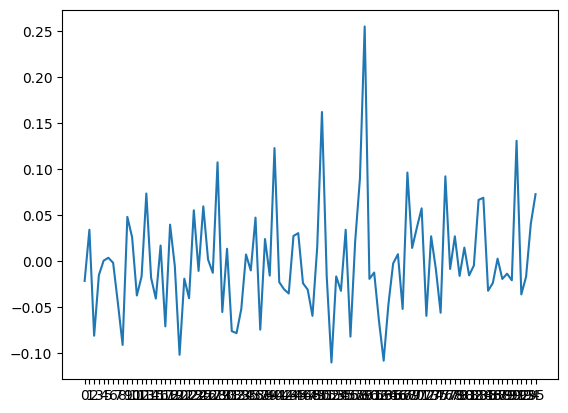

count    96.000000
mean     -0.017059
std       0.160969
min      -0.595298
25%      -0.112402
50%      -0.015855
75%       0.080068
max       0.537587
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


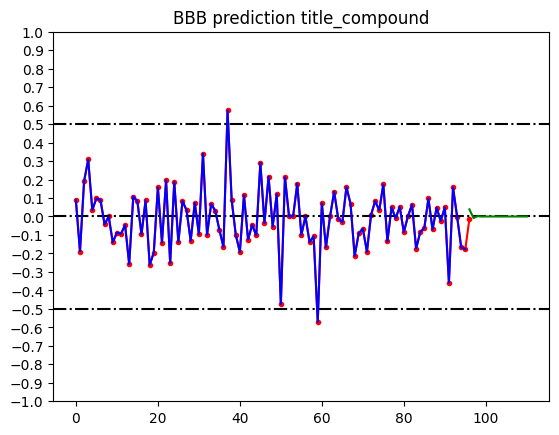

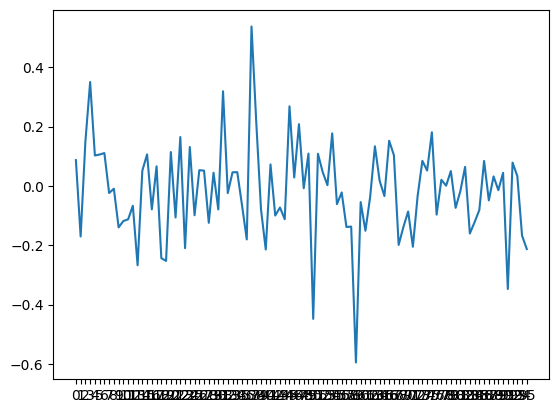

count    74.000000
mean     -0.000584
std       0.143191
min      -0.526543
25%      -0.080218
50%       0.014753
75%       0.086825
max       0.234094
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


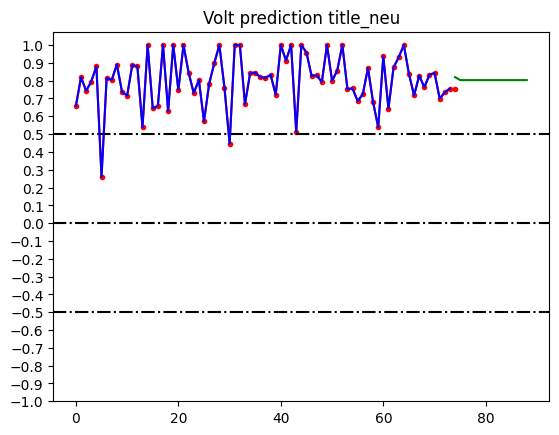

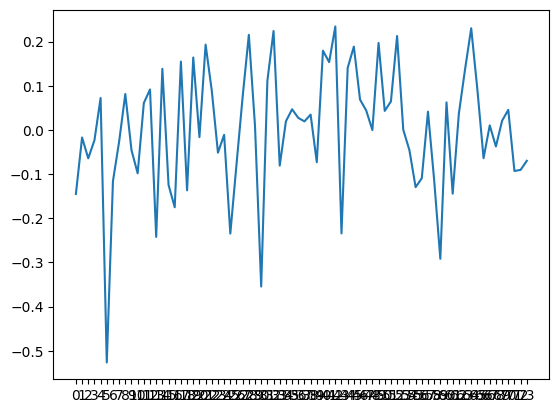

count    7.400000e+01
mean    -4.200844e-17
std      1.158735e-01
min     -9.390516e-02
25%     -9.390516e-02
50%     -2.740516e-02
75%      4.809484e-02
max      6.470948e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


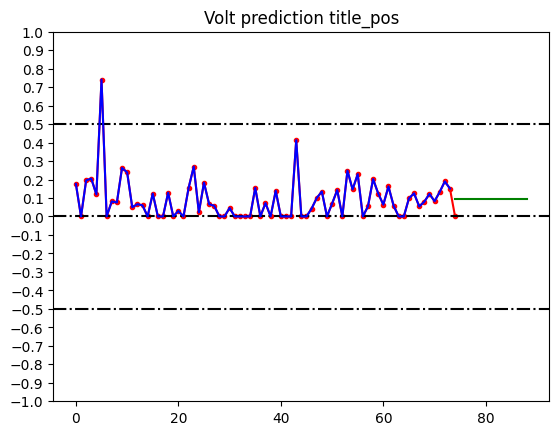

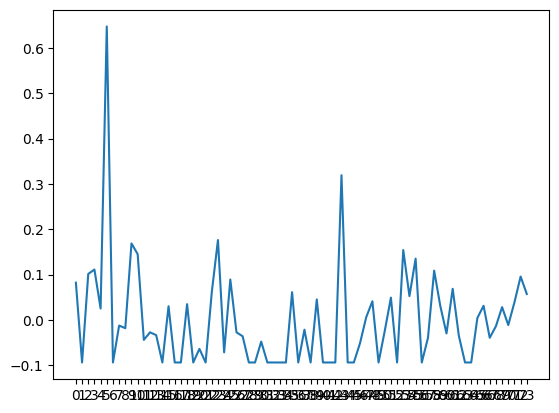

count    7.400000e+01
mean     5.063793e-11
std      1.037388e-01
min     -9.925743e-02
25%     -9.925743e-02
50%     -2.564632e-02
75%      5.874257e-02
max      4.087426e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


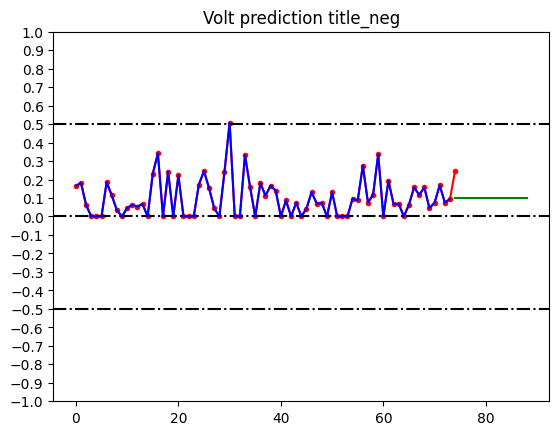

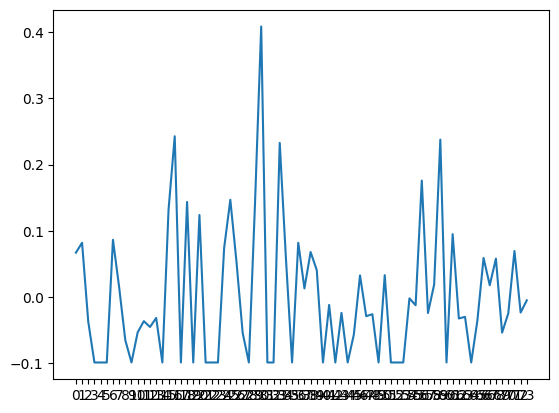

count    74.000000
mean     -0.002463
std       0.293500
min      -0.690800
25%      -0.187415
50%       0.000000
75%       0.153575
max       0.862500
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


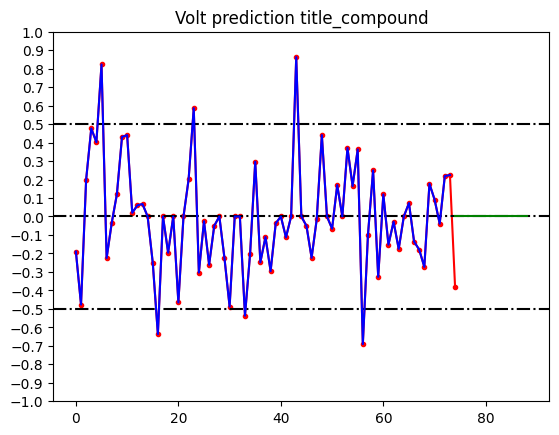

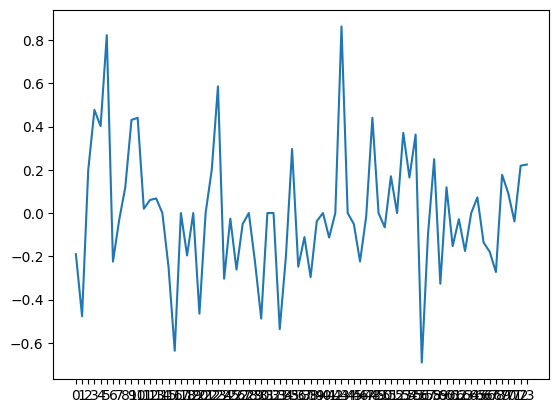

count    2.800000e+01
mean     1.769147e-11
std      1.497639e-01
min     -2.818095e-01
25%     -8.130952e-02
50%      2.969048e-02
75%      8.356548e-02
max      2.141905e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


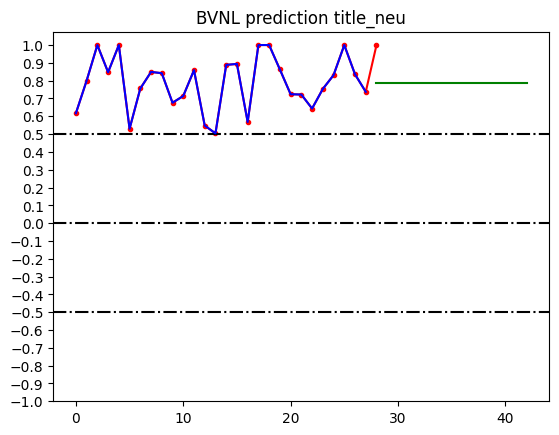

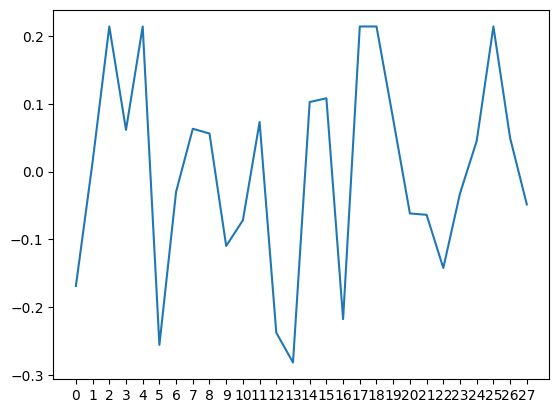

count    2.800000e+01
mean     9.102639e-11
std      1.000157e-01
min     -1.086786e-01
25%     -1.086786e-01
50%     -1.817857e-02
75%      5.957143e-02
max      2.153214e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


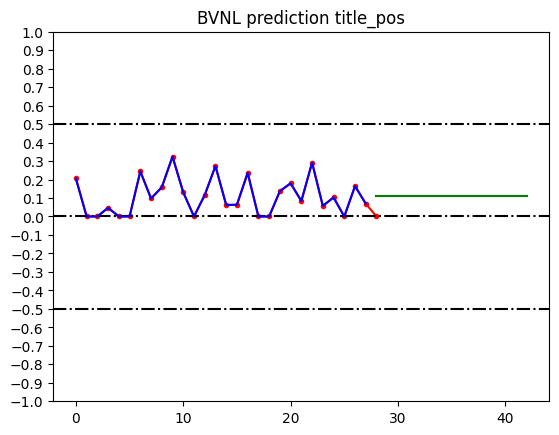

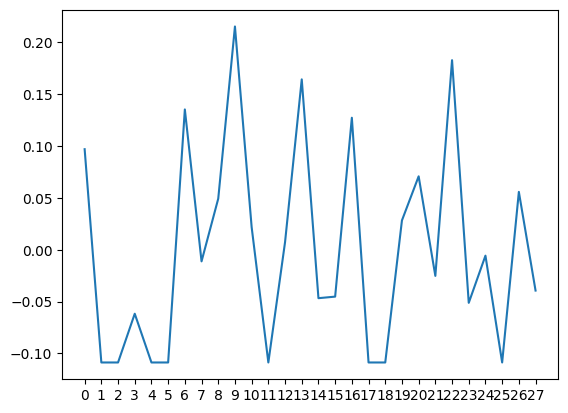

count    2.800000e+01
mean     8.921435e-18
std      1.175331e-01
min     -1.055357e-01
25%     -1.055357e-01
50%     -3.978571e-02
75%      8.446429e-02
max      3.644643e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


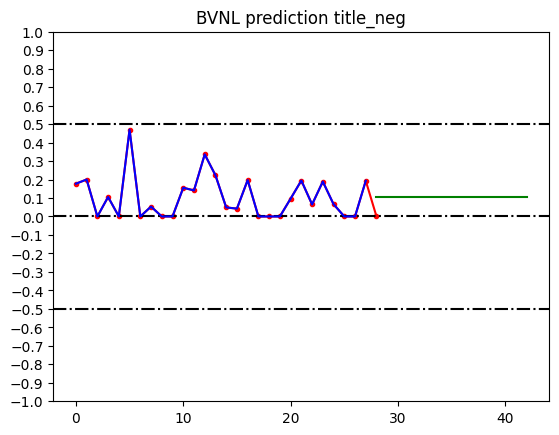

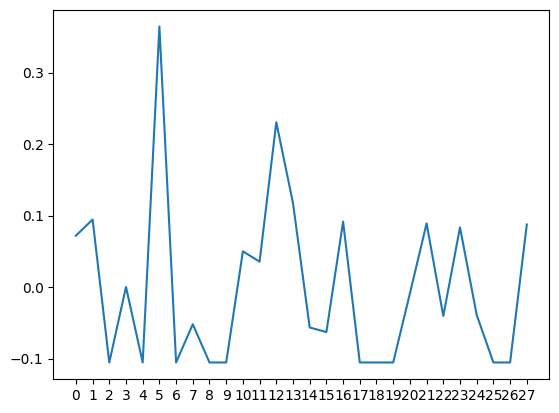

count    28.000000
mean      0.023865
std       0.297771
min      -0.636900
25%      -0.110625
50%       0.007763
75%       0.235125
max       0.493900
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


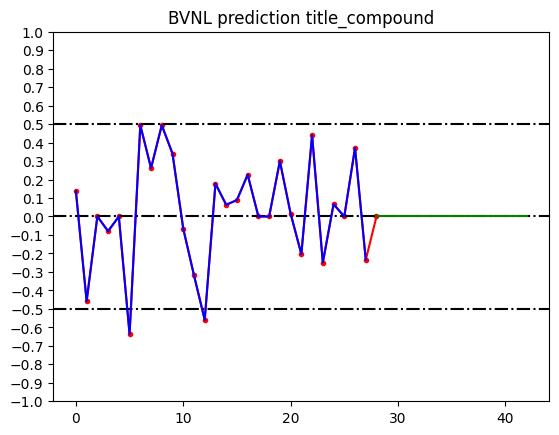

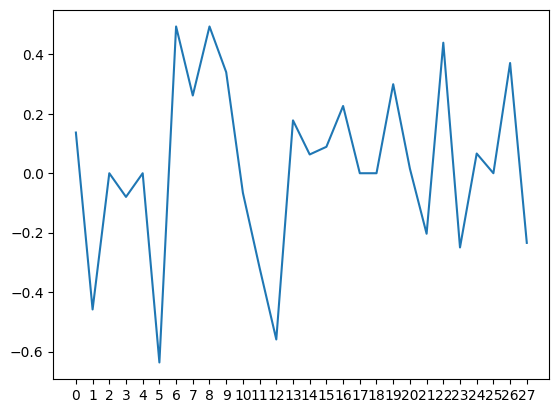

count    9.200000e+01
mean    -1.345542e-16
std      1.014071e-01
min     -4.029041e-01
25%     -4.880022e-02
50%      4.470896e-03
75%      5.101256e-02
max      1.800959e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


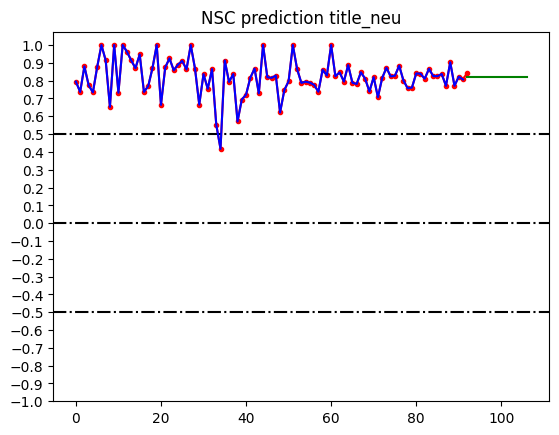

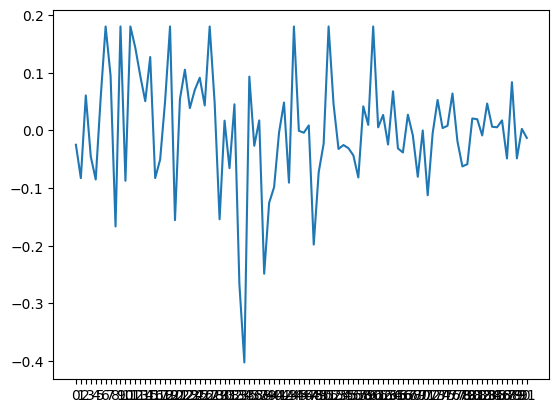

count    9.200000e+01
mean     3.320146e-11
std      8.780224e-02
min     -9.876730e-02
25%     -5.330896e-02
50%     -2.023396e-02
75%      3.584235e-02
max      3.487327e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


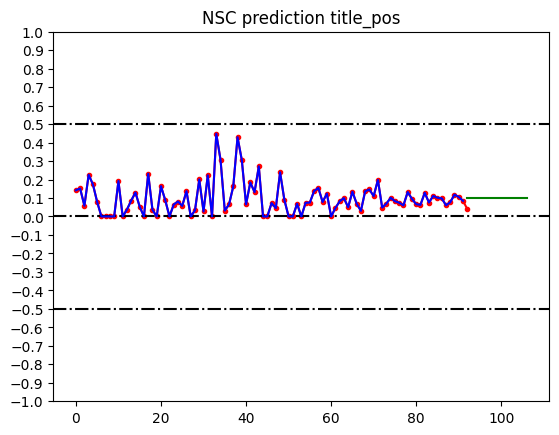

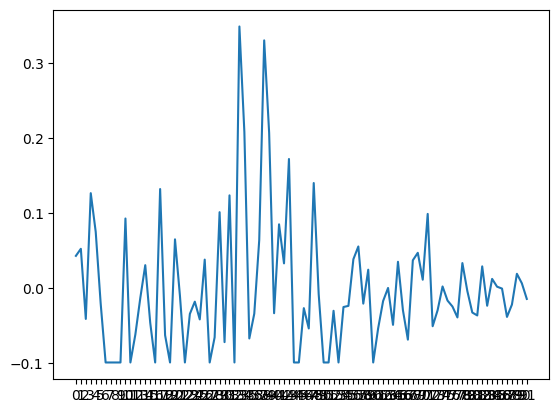

count    92.000000
mean      0.000075
std       0.067731
min      -0.116663
25%      -0.048073
50%      -0.007845
75%       0.036834
max       0.267708
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


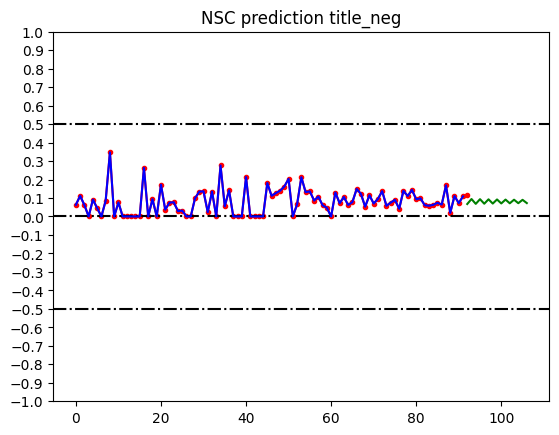

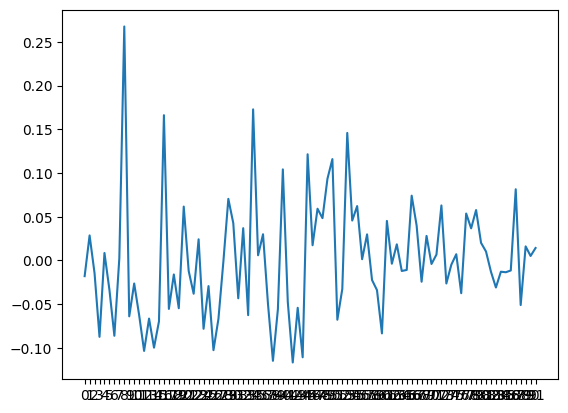

count    92.000000
mean      0.030580
std       0.209829
min      -0.711000
25%      -0.093463
50%       0.027486
75%       0.113196
max       0.659550
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12947/280011536.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))


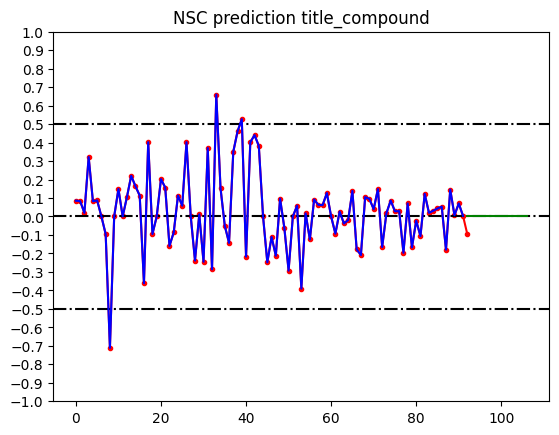

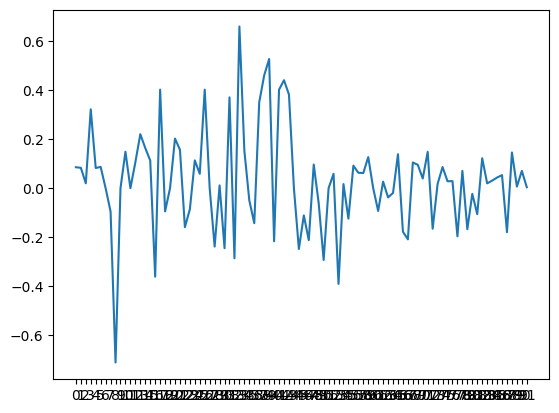

In [23]:
forecast_range = 14

for party_data in parties:
    for sentiment in sentiments:
        train_size = int(len(party_sentiment[party_data][sentiment].dropna())*0.999)
        test_size = len(party_sentiment[party_data][sentiment].dropna()) - train_size

        train,test = train_test_split(party_sentiment[party_data][sentiment].dropna(), train_size=train_size)

        model = pm.auto_arima(train)

        forecasts = model.predict(test.shape[0] + forecast_range)

        fig1, ax1 = plt.subplots()
        ax1.set_title(f"{party_data} prediction {sentiment}")
        x = np.arange(party_sentiment[party_data][sentiment].dropna().shape[0] + forecast_range)
        ax1.plot(x[:len(party_sentiment[party_data][sentiment].dropna())], party_sentiment[party_data][sentiment].dropna(), c='red', marker='.')
        ax1.axhline(y = 0.5, linestyle='-.', c='black')
        ax1.axhline(y = 0, linestyle='-.', c='black')
        ax1.axhline(y = -0.5, linestyle='-.', c='black')
        ax1.plot(x[:train_size], train, c='blue')
        ax1.plot(x[train_size:], forecasts, c='green')
        ax1.set_yticks(np.arange(-1,1.1,0.1))
        
        fig2, ax2 = plt.subplots()
        ax2.plot(model.resid())
        ax2.set_xticklabels(np.arange(len(party_sentiment[party_data])))
        # ax2.tick_params(axis='x', which='minor', direction='out', bottom=True, length='5')
        print(model.resid().describe())
        plt.show()

In [14]:
for party_data in parties:
    for sentiment in sentiments:
        print(f"{party_data} {sentiment} {mk.original_test(party_sentiment[party_data][sentiment])}")


VVD title_neu Mann_Kendall_Test(trend='no trend', h=False, p=0.2381293667228741, z=-1.1796753367906478, Tau=-0.07940205785284411, s=-409.0, var_s=119617.66666666667, slope=-0.00023250291438193407, intercept=0.8230228657077561)
VVD title_pos Mann_Kendall_Test(trend='no trend', h=False, p=0.5611285705257201, z=0.5811660143066141, Tau=0.0392156862745098, s=202.0, var_s=119616.66666666667, slope=6.709608158883533e-05, intercept=0.08352275899087493)
VVD title_neg Mann_Kendall_Test(trend='no trend', h=False, p=0.06984863465319191, z=1.812890999851975, Tau=0.12191807416035721, s=628.0, var_s=119616.66666666667, slope=0.00029680546726001245, intercept=0.07606724859882896)
VVD title_compound Mann_Kendall_Test(trend='no trend', h=False, p=0.2594758580153307, z=-1.1276308366381191, Tau=-0.07590759075907591, s=-391.0, var_s=119617.66666666667, slope=-0.0004650143678160917, intercept=0.020110927353098405)
CDA title_neu Mann_Kendall_Test(trend='decreasing', h=True, p=0.021259124391571182, z=-2.30335

In [15]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm


In [16]:
reg = LinearRegression()
for party_data in parties:
    for sentiment in sentiments:
        reg.fit(np.arange(len(party_sentiment[party_data][sentiment].dropna())).reshape(-1,1), party_sentiment[party_data][sentiment].dropna())

        print(f"Linear model {party_data} {sentiment} is: Y = {reg.intercept_} + {reg.coef_[0]}X")


Linear model VVD title_neu is: Y = 0.8256565069233249 + -0.00025918442143537887X
Linear model VVD title_pos is: Y = 0.08430264901412286 + 6.704602514175419e-05X
Linear model VVD title_neg is: Y = 0.08916975301007503 + 0.00019302397792806794X
Linear model VVD title_compound is: Y = 0.0005172632756877526 + -0.000315422146355952X
Linear model CDA title_neu is: Y = 0.8441030294478601 + -0.000511002821240005X
Linear model CDA title_pos is: Y = 0.08250344338430644 + 0.0002573119049418776X
Linear model CDA title_neg is: Y = 0.0733937536941803 + 0.0002537587089171553X
Linear model CDA title_compound is: Y = 0.029019065330428688 + -8.628185633843534e-05X
Linear model D66 title_neu is: Y = 0.8115443752990184 + 0.00034775801642265646X
Linear model D66 title_pos is: Y = 0.07950192251266362 + 5.945022904444768e-05X
Linear model D66 title_neg is: Y = 0.10897063190874387 + -0.00040737914472735573X
Linear model D66 title_compound is: Y = -0.03921215369460475 + 0.0007843420888540317X
Linear model SGP t

In [18]:
reg = LinearRegression()
for party_data in parties:
    for sentiment in ['title_compound']:
        reg.fit(np.arange(len(party_sentiment[party_data][sentiment].dropna())).reshape(-1,1), party_sentiment[party_data][sentiment].dropna())

        print(f"Linear model {party_data} {sentiment} is: Y = {reg.intercept_} + {reg.coef_[0]}X")

Linear model VVD title_compound is: Y = 0.0005172632756877526 + -0.000315422146355952X
Linear model CDA title_compound is: Y = 0.029019065330428688 + -8.628185633843534e-05X
Linear model D66 title_compound is: Y = -0.03921215369460475 + 0.0007843420888540317X
Linear model SGP title_compound is: Y = 0.0731448315150686 + -5.9572249734138295e-05X
Linear model GroenLinks-PvdA title_compound is: Y = 0.02279396279012055 + -0.00029288006616305895X
Linear model SP title_compound is: Y = 0.0490768406632524 + -0.0003368712789791912X
Linear model CU title_compound is: Y = -0.020626257265674394 + 0.002204940985308333X
Linear model PvdD title_compound is: Y = 0.038538612410729006 + -0.0008255424280519772X
Linear model PVV title_compound is: Y = 0.02568904821925054 + -0.0007510749569477437X
Linear model 50Plus title_compound is: Y = -0.03474096774193548 + -0.001295335558027438X
Linear model Denk title_compound is: Y = -0.020858691040629773 + -0.0004437044907816008X
Linear model FvD title_compound is

In [17]:
for party_data in parties:
    for sentiment in sentiments:
        x = np.arange(len(party_sentiment[party_data][sentiment].dropna()))
        x = sm.add_constant(x)
        y = party_sentiment[party_data][sentiment].dropna()
        est = sm.OLS(y, x).fit()

        print(party_data)
        print(est.summary())


VVD
                            OLS Regression Results                            
Dep. Variable:              title_neu   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     1.562
Date:                 wo, 20 dec 2023   Prob (F-statistic):              0.214
Time:                        12:17:05   Log-Likelihood:                 140.45
No. Observations:                 102   AIC:                            -276.9
Df Residuals:                     100   BIC:                            -271.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8257      0.012     68.111     